ConvPoint

# Compile

In [10]:
cd convpoint

[WinError 2] The system cannot find the file specified: 'convpoint'
c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d\semantic3D_utils


In [11]:
cd knn

[WinError 2] The system cannot find the file specified: 'knn'
c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d\semantic3D_utils


In [12]:
#!python setup.py install --home="."
!python setup.py built_ext --inplace

usage: setup.py [global_opts] cmd1 [cmd1_opts] [cmd2 [cmd2_opts] ...]
   or: setup.py --help [cmd1 cmd2 ...]
   or: setup.py --help-commands
   or: setup.py cmd --help

error: invalid command 'built_ext'


In [13]:
!ls

'ls' is not recognized as an internal or external command,
operable program or batch file.


In [14]:
cd ..

c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d


In [15]:
cd semantic3D_utils

c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d\semantic3D_utils


In [16]:
!python setup.py install --home="."

Sem3D.cxx
Sem3D.cxx(69): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(70): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(71): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(83): warning C4244: '=': conversion from 'double' to 'float', possible loss of data
Sem3D.cxx(87): warning C4244: '=': conversion from 'float' to 'int', possible loss of data
Sem3D.cxx(96): warning C4244: '=': conversion from 'double' to 'float', possible loss of data
Sem3D.cxx(100): warning C4244: '=': conversion from 'float' to 'int', possible loss of data
Sem3D.cxx(155): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(156): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(157): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of dat

c:\Users\yuwei\anaconda3\envs\py37\lib\site-packages\setuptools\command\install.py:37: SetuptoolsDeprecationWarning: setup.py install is deprecated. Use build and pip and other standards-based tools.
  setuptools.SetuptoolsDeprecationWarning,
c:\Users\yuwei\anaconda3\envs\py37\lib\site-packages\setuptools\command\easy_install.py:147: EasyInstallDeprecationWarning: easy_install command is deprecated. Use build and pip and other standards-based tools.
  EasyInstallDeprecationWarning,
TEST FAILED: lib\python\ does NOT support .pth files
bad install directory or PYTHONPATH

You are attempting to install a package to a directory that is not
on PYTHONPATH and which Python does not read ".pth" files from.  The
installation directory you specified (via --install-dir, --prefix, or
the distutils default setting) was:

    lib\python\

and your PYTHONPATH environment variable currently contains:

    ''

Here are some of your options for correcting the problem:

* You can choose a different insta

# Prepare data

In [2]:
import laspy
import numpy as np

In [3]:
#las = laspy.read("data/lecco/original_data/tem/Lecco_campus_1.laz")
las = laspy.read("D:\\PRIN\\Data\\mantua_original_data\\mantova_X70_intensity.las")

In [4]:
point_format = las.point_format
list(point_format.dimension_names)

['X',
 'Y',
 'Z',
 'intensity',
 'return_number',
 'number_of_returns',
 'synthetic',
 'key_point',
 'withheld',
 'overlap',
 'scanner_channel',
 'scan_direction_flag',
 'edge_of_flight_line',
 'classification',
 'user_data',
 'scan_angle',
 'point_source_id',
 'gps_time',
 'red',
 'green',
 'blue']

In [5]:
las.intensity

array([34952,     0, 32895, ..., 20560, 26728, 25700], dtype=uint16)

In [ ]:
#rgb = np.concatenate((np.expand_dims(las.red, 1), np.expand_dims(las.green, 1), np.expand_dims(las.blue, 1)), 1)

In [6]:
rgb = np.vstack((las.red.astype(np.int8), las.green.astype(np.int8),las.blue.astype(np.int8))).transpose()
rgb.shape

(18121586, 3)

In [ ]:
rgb[2]

array([89, 68, 58], dtype=int8)

In [7]:
coords = np.vstack((las.x, las.y,las.z)).transpose()

In [7]:
coords[:, 0] -= np.mean(coords[:, 0]) + 0.5
coords[:, 1] -= np.mean(coords[:, 1]) + 0.5
coords = coords.astype(np.float32)

In [ ]:
coords[:, 0] -= np.mean(coords[:, 0]) + 0.5
coords[:, 1] -= np.mean(coords[:, 1]) + 0.5
coords[:, 2] -= np.mean(coords[:, 2]) + 0.5
coords = coords.astype(np.float32)

In [ ]:
print(coords.shape)

(18121586, 3)


In [8]:
ointensity = np.expand_dims((las.intensity), 1).astype(np.uint8)

In [ ]:
ointensity.shape

(18121586, 1)

In [ ]:
cd examples/npm3d/

c:\Users\yuwei\Documents\ConvPoint\examples\npm3d


In [ ]:
from helper_ply import write_ply
write_ply('./data/mantova_X70_intensity', [coords, ointensity], ['x', 'y', 'z', 'intensity'])

True

In [12]:
from helper_ply import write_ply
write_ply('D:\\PRIN\\Data\\mantua_npm\\stonex_tutte_intensity_rgb.txt', [coords, ointensity, rgb], ['x', 'y', 'z', 'intensity', 'red', 'green', 'blue'])

True

In [ ]:
intensity = []
intensity = np.expand_dims(((0.2125 * (las.red.astype(np.int8)) + 0.7154 * (las.green.astype(np.int8)) + 0.0721 * (las.blue.astype(np.int8)))/255),1).astype(np.float32)

In [ ]:
intensity[1]

array([0.24721372], dtype=float32)

In [ ]:
#calculated intensity
from helper_ply import write_ply
write_ply('../data/output/Agliate_2_xyzirgbr', [coords, intensity, rgb], ['x', 'y', 'z', 'intensity', 'red', 'green', 'blue'])

True

In [ ]:
normalization = 1 / 65535
ointensity = np.expand_dims((las.intensity * normalization), 1).astype(np.float32)

In [ ]:
#original/normalized intensity
from helper_ply import write_ply
write_ply('../data/Agliate_outdoor_1_xyzoirgbr', [coords, ointensity, rgb], ['x', 'y', 'z', 'intensity', 'red', 'green', 'blue'])

True

In [ ]:
#orignial/normalized intensity
save_fname = '../data/Agliate_outdoor_2_xyznirgbr.txt'
xyzrgb = np.concatenate([coords, ointensity, rgb], axis=1)
np.savetxt(save_fname,xyzrgb,fmt=['%.4f','%.4f','%.4f','%.4f','%d','%d','%d'])

In [9]:
#orignial/normalized intensity
save_fname = 'D:\\PRIN\\Data\\mantua_semantic3d\\stonex_tutte_intensity_xyz.txt'
xyzirgb = np.concatenate([coords, ointensity, rgb], axis=1)
np.savetxt(save_fname,xyzirgb,fmt=['%.4f','%.4f','%.4f','%.4f','%d','%d','%d'])

In [11]:
#orignial/normalized intensity
save_fname = 'D:\\PRIN\\Data\\mantua_original_data\\mantova_X70_intensity.txt'
xyzirgb = np.concatenate([coords, ointensity, rgb], axis=1)
np.savetxt(save_fname,xyzirgb,fmt=['%.4f','%.4f','%.4f','%d','%d','%d','%d'])

# Lecco_campus dataset

## pre-trained model use NPM3D as training data

NPM3D:{1: 'ground',2: 'buildings',3: 'poles',4: 'bollards', 5: 'trash_cans',6: 'barriers',7: 'pedestrians',8: 'cars', 9: 'natural'}

### 1. use original data - Lecco_campus_1_xyzi_registered

In [ ]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./data/npm_processed --test

./data\test_10_classes\mantova_X70_intensity.ply
ply
format binary_little_endian 1.0
element vertex 18121586
property double x
property double y
property double z
property uchar intensity
end_header


#### SegBig_intensity model

In [ ]:
cd examples/npm3d/

c:\Users\yuwei\Documents\ConvPoint\examples\npm3d


In [ ]:
!python mantua_seg_test.py --rootdir ./data/npm_processed --savedir ./results/SegBig_intensity --test --savepts --batch_size 4

Create filelist...done, 0 train files, 1 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
mantova_X70_intensity.npy



  0%|                                                 | 0/22516 [00:00<?, ?it/s]C:/cb/pytorch_1000000000000/work/aten/src/ATen/native/cuda/IndexKernel.cu:84: block: [64,0,0], thread: [96,0,0] Assertion `index >= -sizes[i] && index < sizes[i] && "index out of bounds"` failed.
C:/cb/pytorch_1000000000000/work/aten/src/ATen/native/cuda/IndexKernel.cu:84: block: [64,0,0], thread: [97,0,0] Assertion `index >= -sizes[i] && index < sizes[i] && "index out of bounds"` failed.
C:/cb/pytorch_1000000000000/work/aten/src/ATen/native/cuda/IndexKernel.cu:84: block: [64,0,0], thread: [98,0,0] Assertion `index >= -sizes[i] && index < sizes[i] && "index out of bounds"` failed.
C:/cb/pytorch_1000000000000/work/aten/src/ATen/native/cuda/IndexKernel.cu:84: block: [64,0,0], thread: [99,0,0] Assertion `index >= -sizes[i] && index < sizes[i] && "index out of bounds"` failed.
C:/cb/pytorch_1000000000000/work/aten/src/ATen/native/cuda/IndexKernel.cu:84: block: [64,0,0], thread: [100,0,0] Assertion `index >= -s

In [ ]:
!python npm3d_seg.py --rootdir ./data/npm_processed --savedir ./results/SegBig_intensity --test --savepts

Create filelist...done, 0 train files, 1 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Agliate_2_xyzoirgbr.npy



  0%|                                                  | 0/4135 [00:58<?, ?it/s]
Traceback (most recent call last):
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\npm3d_seg.py", line 411, in <module>
    main()
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\npm3d_seg.py", line 378, in main
    outputs = net(features, pts)
  File "c:\Users\yuwei\anaconda3\envs\py39\lib\site-packages\torch\nn\modules\module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\../..\networks\network_seg.py", line 159, in forward
    x0, _ = self.cv0(x, input_pts, 16)
  File "c:\Users\yuwei\anaconda3\envs\py39\lib\site-packages\torch\nn\modules\module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\../..\convpoint\nn\conv.py", line 78, in forward
    features = input.view(-1, input.size(2))[indices]
IndexError: index 3420082460

#### SegBig_nocolor model

In [ ]:
!python mantua_seg_test.py --rootdir ./data/npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 0 train files, 1 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
mantova_X70_intensity.npy



  0%|                                                  | 0/1408 [00:15<?, ?it/s]
Traceback (most recent call last):
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\mantua_seg_test.py", line 385, in <module>
    main()
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\mantua_seg_test.py", line 356, in main
    outputs = net(features, pts)
  File "c:\Users\yuwei\anaconda3\envs\py39\lib\site-packages\torch\nn\modules\module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\../..\networks\network_seg.py", line 159, in forward
    x0, _ = self.cv0(x, input_pts, 16)
  File "c:\Users\yuwei\anaconda3\envs\py39\lib\site-packages\torch\nn\modules\module.py", line 1051, in _call_impl
    return forward_call(*input, **kwargs)
  File "c:\Users\yuwei\Documents\ConvPoint\examples\npm3d\../..\convpoint\nn\conv.py", line 78, in forward
    features = input.view(-1, input.size(2))[indices]
IndexError: inde

---

**Result**:

> The overall result is good, most points are classified correctly, especially buildings (Fig.1).

> But, the natuals are partly classified as building or unlabelled (Fig.2), and some points around but not close to building are classified as nature (Fig.3).

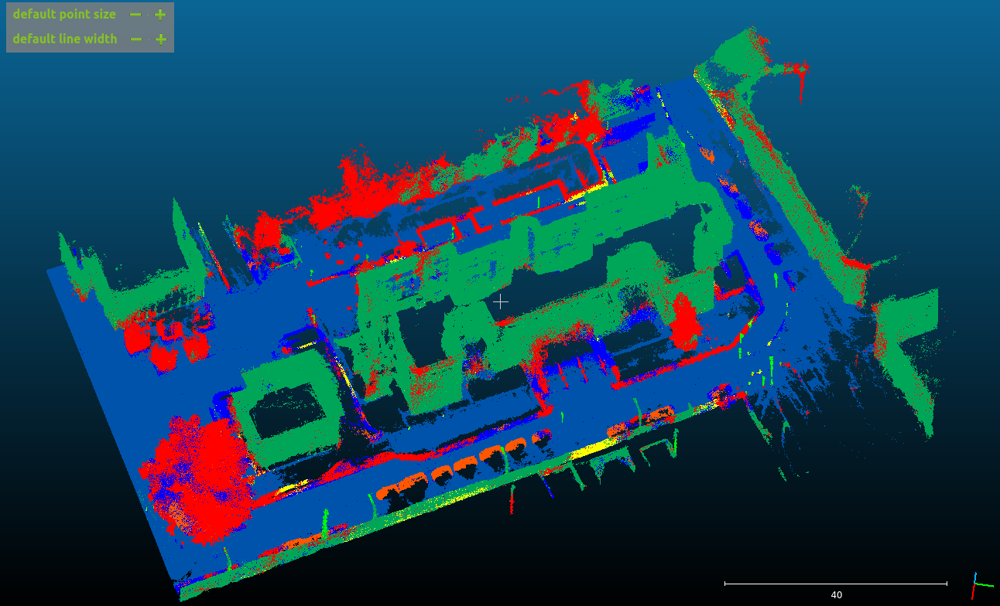

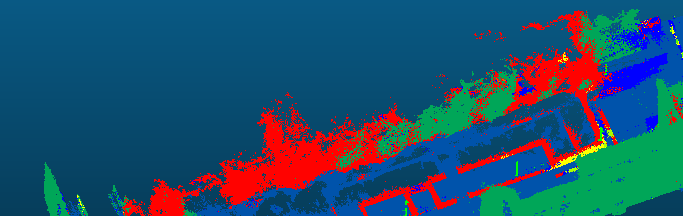

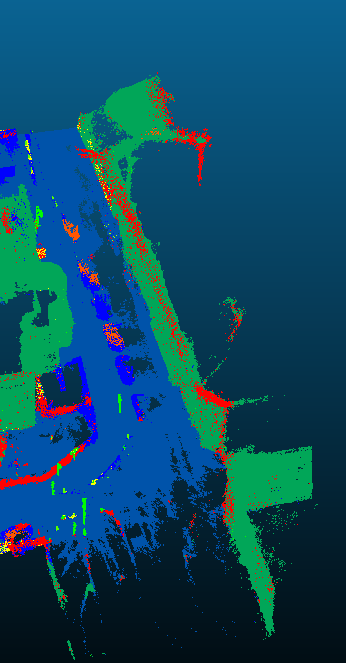

In [ ]:
#remove used data to a tem folder
!mv ./npm_processed/data/test_10_classes/Lecco_campus_1_xyzi_registered.ply ./npm_processed/data/test_10_classes/tt/
!mv ./npm_processed/test_pointclouds/Lecco_campus_1_xyzi_registered.npy ./npm_processed/test_pointclouds/tt/

---

Denoised data

In [ ]:
cd ../npm3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/npm3d


In [ ]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed --test

./data/test_10_classes/Lecco_denoised.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 21/05/2023 10:00
obj_info Generated by CloudCompare!
element vertex 2847202
property float x
property float y
property float z
end_header


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 1132 train files, 1 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_denoised.npy
100%|█████████████████████████████████████| 1904/1904 [1:52:36<00:00,  3.55s/it]
scores shape: (2847202, 10)
Computing neighbors...
(2847202, 3)
(2847202, 3)
(2847202, 1)
Done
make results file...
Saving results...
saveing file: ./results/SegBig_nocolor/results/Lecco_denoised.npy_pts.txt
output point cloud saved at ./results/SegBig_nocolor
2023-05-21 12:15:56.416609-Done.


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor --block_size 4

Create filelist...done, 1132 train files, 1 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_denoised.npy
100%|█████████████████████████████████████| 1904/1904 [2:09:05<00:00,  4.07s/it]
scores shape: (2847202, 10)
Computing neighbors...
(2847202, 3)
(2847201, 3)
(2847202, 1)
Done
make results file...
Saving results...
saveing file: ./results/SegBig_nocolor/results/Lecco_denoised.npy_pts.txt
output point cloud saved at ./results/SegBig_nocolor
2023-05-22 12:03:00.020447-Done.


---

### 2. Split data and then test

pre-prepare: using cloudcompare to split the whole scene to two parts:
> Lecco_campus_1_xyzi_registered_01.ply
> Lecco_campus_1_xyzi_registered_02.ply

output to ./npm_processed/data/test_10_classes/ directory

In [ ]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed --test

./data/test_10_classes/Lecco_campus_1_xyzi_registered_01.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 11/02/2022 15:08
obj_info Generated by CloudCompare!
element vertex 12891040
property float x
property float y
property float z
property float scalar_intensity
end_header
./data/test_10_classes/Lecco_campus_1_xyzi_registered_02.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 11/02/2022 15:11
obj_info Generated by CloudCompare!
element vertex 5680204
property float x
property float y
property float z
property float scalar_intensity
end_header


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 0 train files, 4 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_01.npy
100%|█████████████████████████████████████████| 459/459 [24:50<00:00,  3.25s/it]
Computing neighbors
(12891040, 3)
(12891040, 1)
Done
Lecco_campus_1_xyzi_registered_02.npy
100%|█████████████████████████████████████████| 377/377 [18:26<00:00,  2.93s/it]
Computing neighbors
(5680204, 3)
(5680204, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
#remove used data to a tem folder
!mv ./npm_processed/data/test_10_classes/Lecco_campus_1_xyzi_registered_01.ply ./npm_processed/data/test_10_classes/tt/
!mv ./npm_processed/data/test_10_classes/Lecco_campus_1_xyzi_registered_02.ply ./npm_processed/data/test_10_classes/tt/

In [ ]:
#remove used data to a tem folder
!mv ./npm_processed/test_pointclouds/Lecco_campus_1_xyzi_registered_01.npy ./npm_processed/test_pointclouds/tt/
!mv ./npm_processed/test_pointclouds/Lecco_campus_1_xyzi_registered_02.npy ./npm_processed/test_pointclouds/tt/

**Result:**

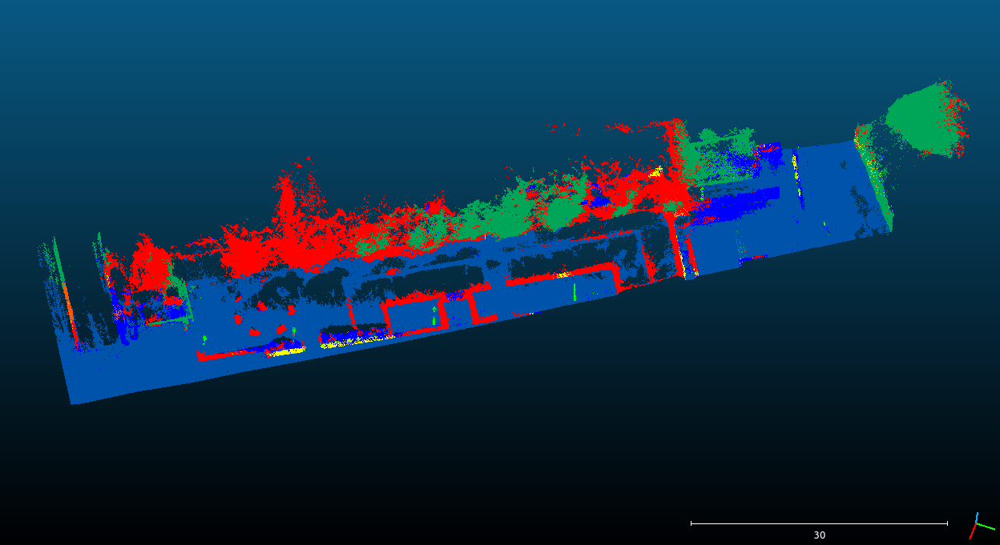

**Analysis:**

The tree part still not improve

---

### 3. Use denoised data - Lecco_campus_1_xyzi_registered_denoise

pre-prepare: using cloudcompare to denoise original data (tools -> clean -> noise filter):
> Lecco_campus_1_xyzi_registered.ply => Lecco_campus_1_xyzi_registered_denoise.ply

output to ./npm_processed/data/test_10_classes/ directory

In [ ]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed --test

./data/test_10_classes/Lecco_campus_1_xyzi_registered_denoise.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 10/02/2022 17:31
obj_info Generated by CloudCompare!
element vertex 31650893
property float x
property float y
property float z
property float scalar_intensity
end_header


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_intensity --test --savepts

Create filelist...done, 0 train files, 3 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_denoise.npy
100%|█████████████████████████████████████| 1881/1881 [2:01:37<00:00,  3.88s/it]
Computing neighbors
(31650893, 3)
(31650893, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 0 train files, 3 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_denoise.npy
100%|█████████████████████████████████████| 1881/1881 [2:01:23<00:00,  3.87s/it]
Computing neighbors
(31650893, 3)
(31650893, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
#remove used data to a tem folder
!mv ./npm_processed/data/test_10_classes/Lecco_campus_1_xyzi_registered_denoise.npy ./npm_processed/data/test_10_classes/tt/
!mv ./npm_processed/test_pointclouds/Lecco_campus_1_xyzi_registered_denoise.npy ./npm_processed/test_pointclouds/tt/

**Result:**

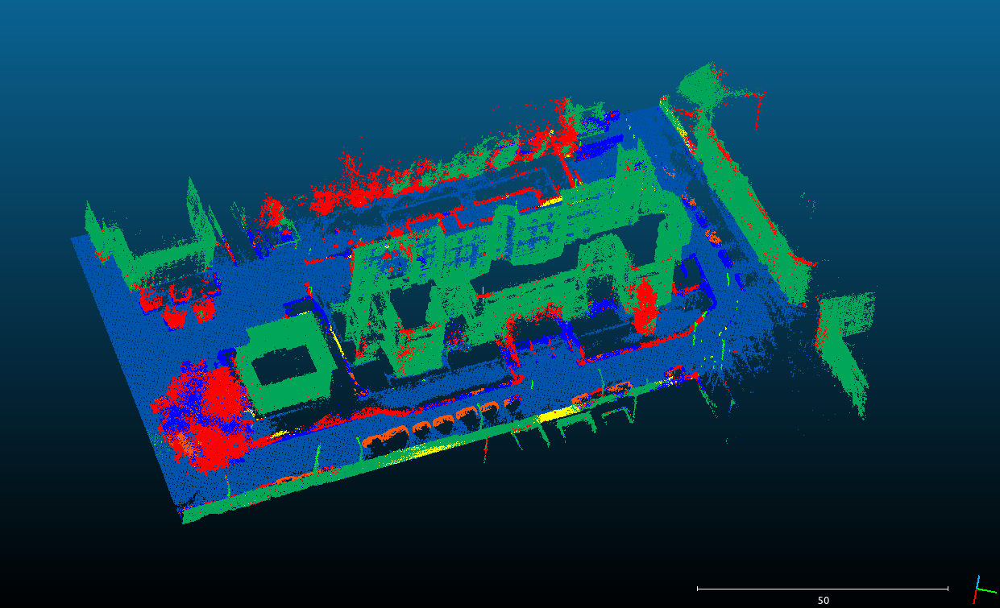

**Analysis:**

> the points scattered around buildings became less, so the classfication result on these points comes better.

> the tree parts still not improved and the car on the right street are not correct.

---

### 4. Use data after SOR CLEAN - Lecco_campus_1_xyzi_registered_sor

pre-prepare: using cloudcompare to sor original data (tools -> clean -> sor filter):
> Lecco_campus_1_xyzi_registered.ply => Lecco_campus_1_xyzi_registered_sor.ply

output to ./npm_processed/data/test_10_classes/ directory

In [ ]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed --test

./data/test_10_classes/Lecco_campus_1_xyzi_registered_sor.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 10/02/2022 17:43
obj_info Generated by CloudCompare!
element vertex 46881013
property float x
property float y
property float z
property float scalar_intensity
end_header


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 0 train files, 3 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_sor.npy
100%|█████████████████████████████████████| 1811/1811 [2:19:29<00:00,  4.62s/it]
Computing neighbors
(46881013, 3)
(46881013, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result:**

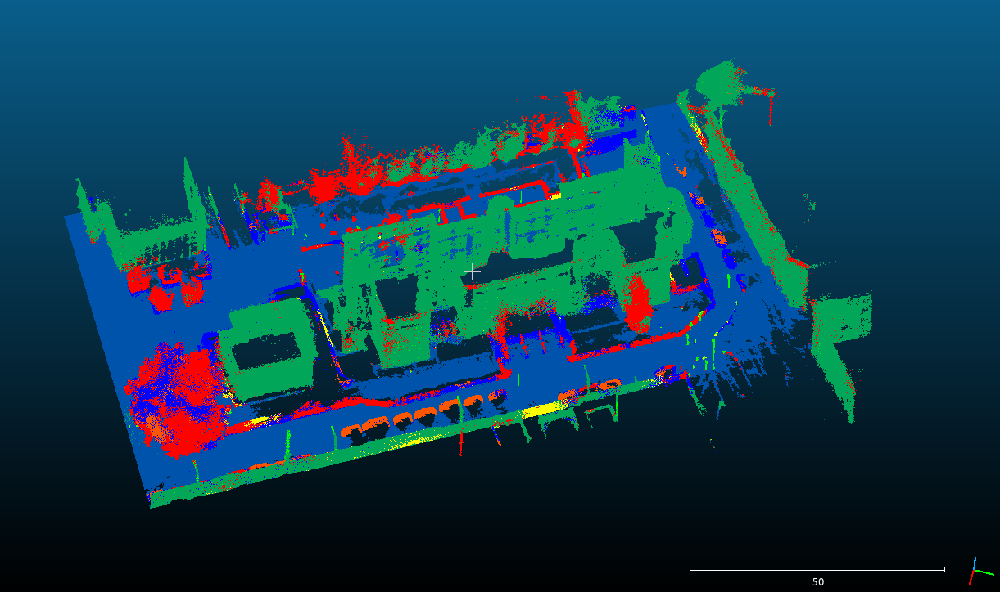

**Analysis:**

same result as denoise.

---

### 5. Change test_step

#### Set test_step to 0.2 - use Lecco_campus_1_xyzi_registered_sor.npy data, SegBig_nocolor model, save to result02

In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results02/SegBig_nocolor --test --savepts --test_step 0.2

Create filelist...done, 0 train files, 3 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_sor.npy
100%|██████████████████████████████████| 10116/10116 [16:34:09<00:00,  5.90s/it]
Computing neighbors
(46881013, 3)
(46881013, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
!mv ./npm_processed/test_pointclouds/Lecco_campus_1_xyzi_registered_sor.npy ./npm_processed/test_pointclouds/tt/
!mv ./npm_processed/data/test_10_classes/Lecco_campus_1_xyzi_registered_sor.ply ./npm_processed/data/test_10_classes/tt/

**Result (results02/.../Lecco_campus_1_xyzi_registered_sor_step_02.npy_pts.txt):**

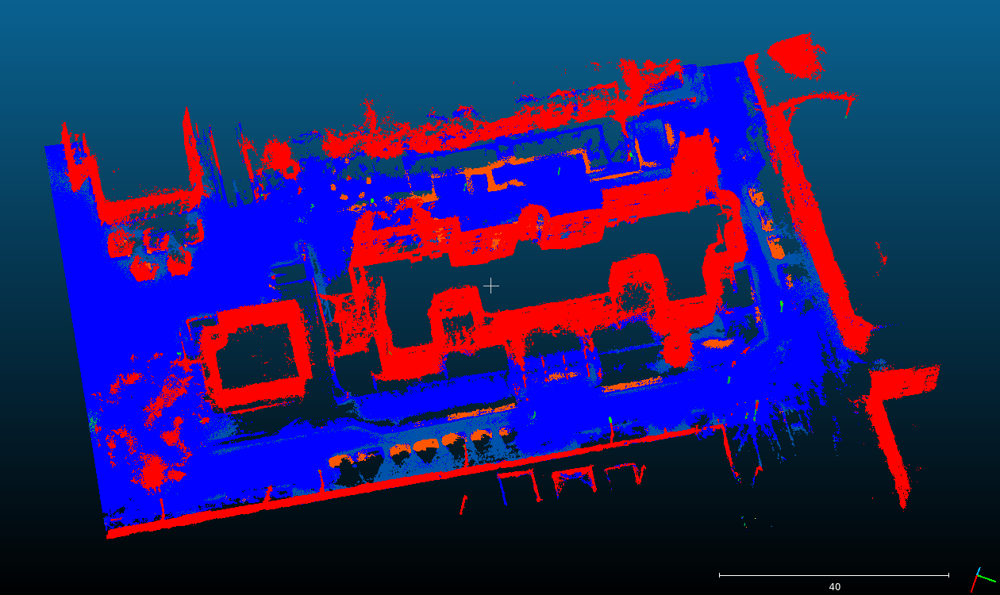

**Analysis:**

Too small step_size, all building are classified into nature/

Try to adjust to test_step to 0.3 and only test on part of data to speed up


---



#### Set test_step to 0.3 - use Lecco_campus_1_xyzi_registered_02.npy (part of original) data, SegBig_nocolor model, save to result02

In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results02/SegBig_nocolor --test --savepts --test_step 0.3

Create filelist...done, 0 train files, 3 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Lecco_campus_1_xyzi_registered_02.npy
100%|█████████████████████████████████████████| 972/972 [42:54<00:00,  2.65s/it]
Computing neighbors
(5680204, 3)
(5680204, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 384, in <module>
    main()
  File "npm3d_seg.py", line 339, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result (results02/.../Lecco_campus_1_xyzi_registered_02_step_03.npy_pts.txt):**

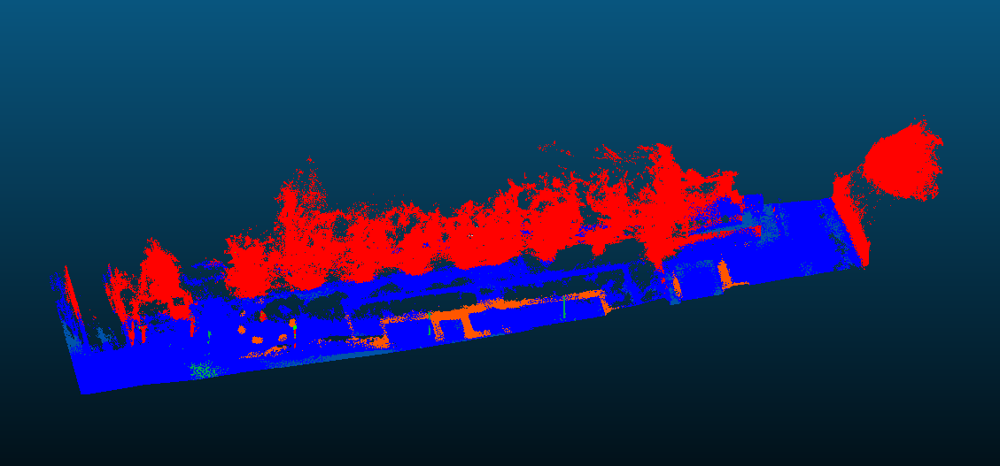

Lecco_campus_1_xyzi_registered_02 while test_step = 0.3


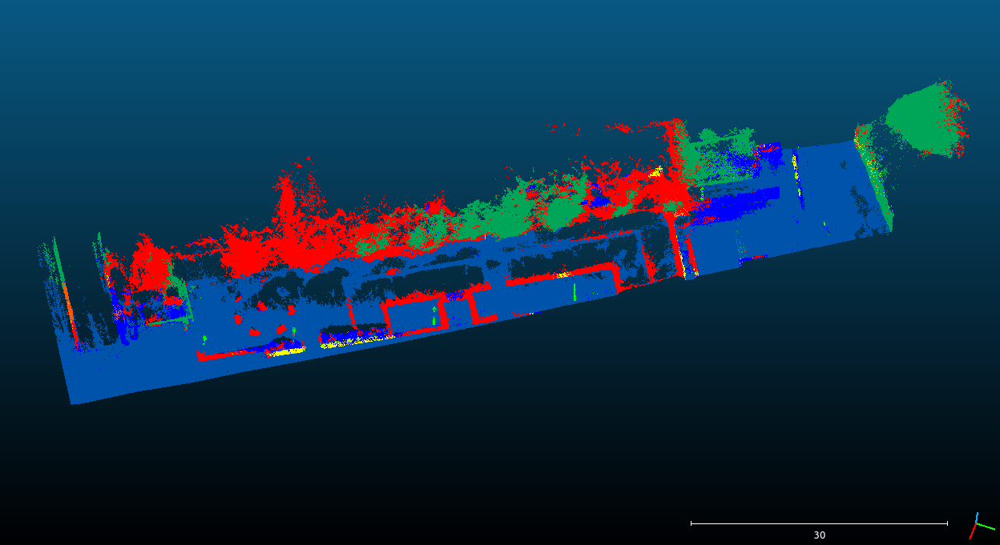

Lecco_campus_1_xyzi_registered_02 while test_step = 0.5

**Analysis:**

Still too small test_step that result in all building are classified into nature

try to increase the step size to 0.4


---



**Section Conclusion:**


idea: classify using 0.5 - split(bad tree) - classify using 0.3 - merge splits

Result:

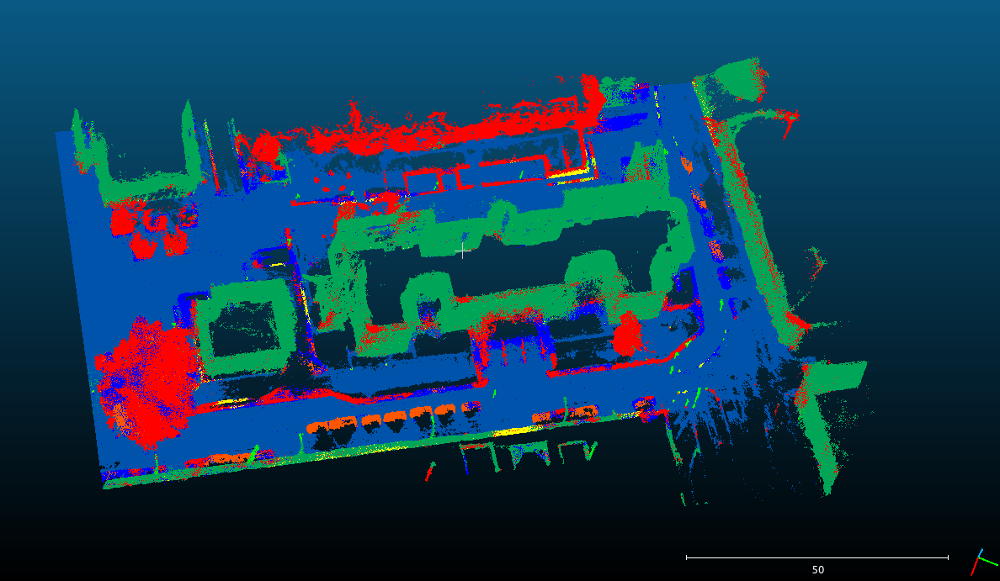

### 6. Use fusion model to test result

In [ ]:
!mv ./npm_processed/test_pointclouds/tt/Lecco_campus_1_xyzi_registered.npy ./npm_processed/test_pointclouds/

In [ ]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results/Fusion_8192pts --model_rgb ./results/SegBig_intensity --model_noc ./results/SegBig_nocolor --test --savepts

Create filelist...done, 0 train files, 3 test files
Creating the network...Done
Lecco_campus_1_xyzi_registered.npy
100%|███████████████████████████████████████| 799/799 [2:32:35<00:00, 11.46s/it]
(49746942, 3)
(49746942, 1)
1 9
tt
Traceback (most recent call last):
  File "npm3d_seg_fusion.py", line 409, in <module>
    main()
  File "npm3d_seg_fusion.py", line 355, in main
    test_step=args.test_step
  File "npm3d_seg_fusion.py", line 172, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results/Fusion_8192pts --model_rgb ./results/SegBig_intensity --model_noc ./results/SegBig_nocolor --test --savepts --test_step 0.4

Create filelist...done, 0 train files, 3 test files
Creating the network...Done
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 2923/2923 [8:48:21<00:00, 10.85s/it]
(49746942, 3)
(49746942, 1)
1 9
tt
Traceback (most recent call last):
  File "npm3d_seg_fusion.py", line 409, in <module>
    main()
  File "npm3d_seg_fusion.py", line 355, in main
    test_step=args.test_step
  File "npm3d_seg_fusion.py", line 172, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**

**Result (./results/Fusion_8192pts/results/Lecco_campus_1_xyzi_registered.npy_pts.txt):**

Lecco_campus_1_xyzi_registered while test_step = 0.5:

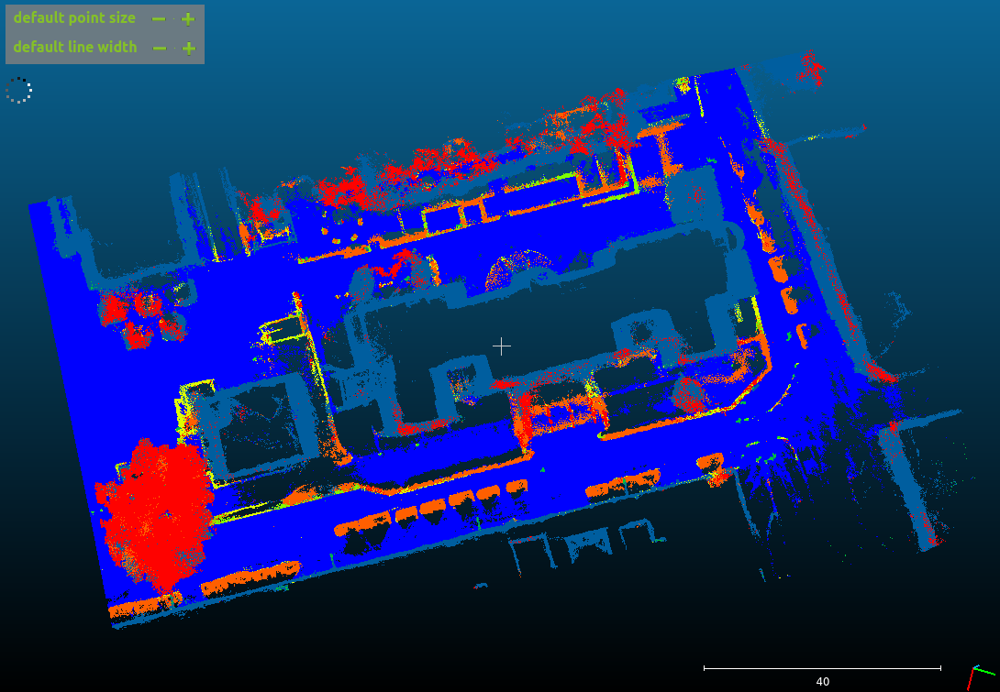

Lecco_campus_1_xyzi_registered while test_step = 0.4:
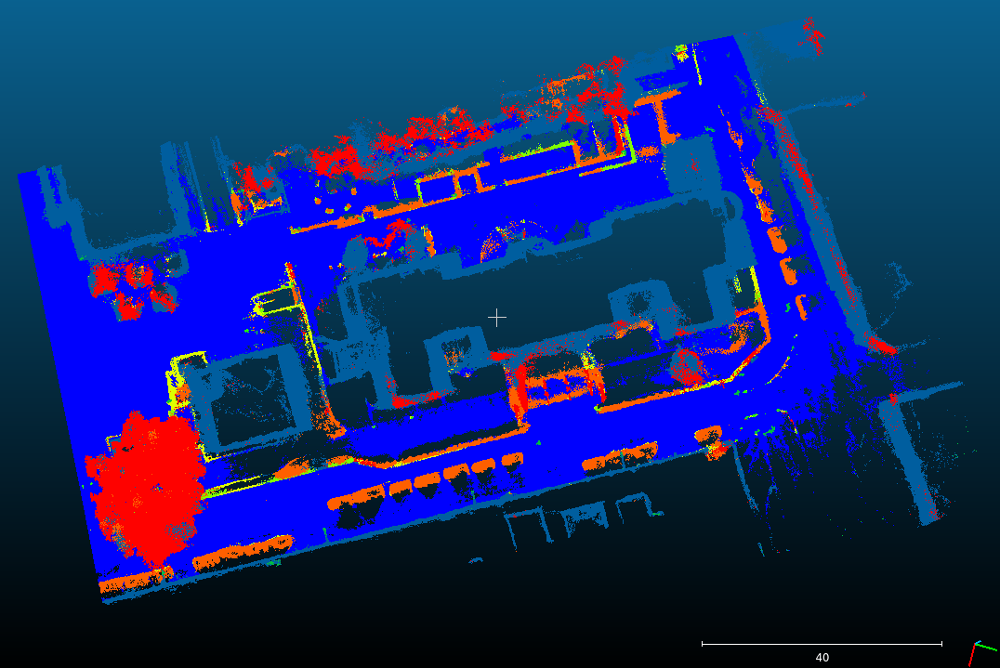


**Analysis:**

1. car segmetation is better than no_color model
2. when step==0.4 the segmentation result at corner tree at left-bottom better than step==0.5
3. poles are worse than no_color model

## pre-trained model use Semantic3D as training data

Semantic3D: {
1: 'man-made terrain',
2: 'natural terrain',
3: 'high vegetation',
4: 'low vegetation',
5: 'buildings',
6: 'hard scape',
7: 'scanning artefacts',
8: 'cars'}

### 1. Use SegBig_rgb model: Lecco_campus_1_xyzrgbr.txt

In [ ]:
!python semantic3d_prepare_data.py --rootdir ./data

Creating train directories...done
Creating test directories...done
Generating test files...
Lecco_campus_1_xyzrgbr
49.7M points loaded
Done


In [ ]:
cd ../semantic3d/

c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d


In [ ]:
cd semantic3D_utils/

c:\Users\yuwei\Documents\ConvPoint\examples\semantic3d\semantic3D_utils


In [ ]:
!python semantic3d_prepare_data_test.py --rootdir ./data

python: can't open file 'semantic3d_prepare_data_test.py': [Errno 2] No such file or directory


In [18]:
!python setup.py build_ext --inplace

Sem3D.cxx
Sem3D.cxx(69): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(70): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(71): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(83): warning C4244: '=': conversion from 'double' to 'float', possible loss of data
Sem3D.cxx(87): warning C4244: '=': conversion from 'float' to 'int', possible loss of data
Sem3D.cxx(96): warning C4244: '=': conversion from 'double' to 'float', possible loss of data
Sem3D.cxx(100): warning C4244: '=': conversion from 'float' to 'int', possible loss of data
Sem3D.cxx(155): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(156): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of data
Sem3D.cxx(157): warning C4244: 'initializing': conversion from 'double' to 'int', possible loss of dat

cl : Command line warning D9002 : ignoring unknown option '-std=c++11'
cl : Command line warning D9002 : ignoring unknown option '-fopenmp'
cl : Command line warning D9002 : ignoring unknown option '-std=c++11'
cl : Command line warning D9002 : ignoring unknown option '-fopenmp'
error: command 'C:\\Program Files (x86)\\Microsoft Visual Studio\\2022\\BuildTools\\VC\\Tools\\MSVC\\14.39.33519\\bin\\HostX86\\x64\\cl.exe' failed with exit code 2


In [41]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results/SegBig_rgb --test --savepts

Creating the network...Model with dropout
Done
Lecco_campus_1_xyzrgbr_voxels.npy
100%|█████████████████████████████████████████| 792/792 [38:58<00:00,  2.95s/it]
(2847202, 3)
(2847202, 1)
2022-02-08 21:18:17.024124-Done.


**Result (./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_08.npy_pts.txt):**

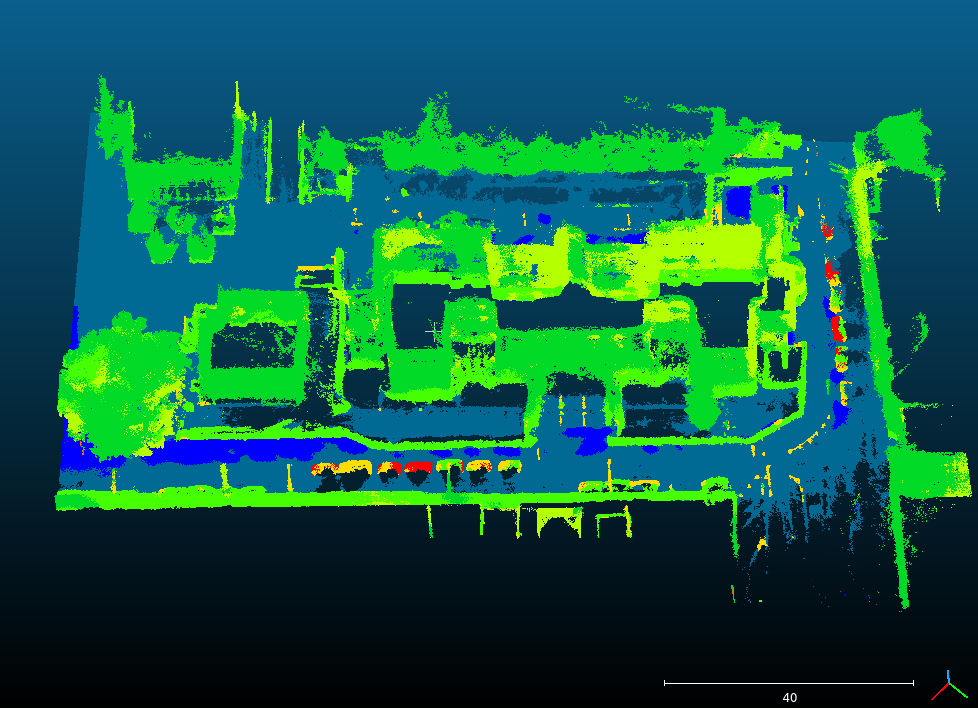

### 2. Use SegBig_nocolor model: Lecco_campus_1_xyzrgbr.txt

In [42]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Lecco_campus_1_xyzrgbr_voxels.npy
100%|█████████████████████████████████████████| 792/792 [40:11<00:00,  3.04s/it]
(2847202, 3)
(2847202, 1)
2022-02-08 22:02:17.221160-Done.


**Result (./semantic3d/results/SegBig_nocolor/results/Lecco_campus_1_xyzrgbr_voxels.npy_pts.txt):**

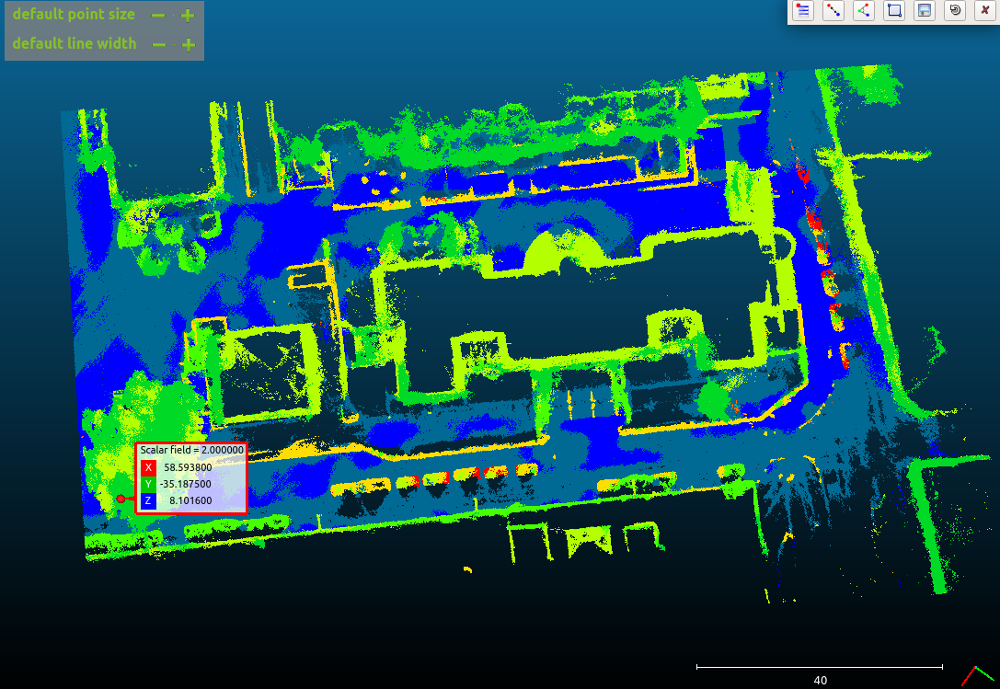

In [11]:
cd ../semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


In [12]:
#denoised data
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Lecco_denoised.npy
100%|█████████████████████████████████████████| 793/793 [49:46<00:00,  3.77s/it]
(2847202, 3)
(2847202, 1)
2023-05-21 14:30:32.033577-Done.


### 2. Change test_step

#### Set test_step to 0.2 - use Lecco_campus_1_xyzi_registered_sor.npy data, SegBig_nocolor model, save to result02

In [95]:
cd ../semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


In [98]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results/SegBig_rgb --test --test_step 0.5 --savepts

Creating the network...Model with dropout
Done
Lecco_campus_1_xyzrgbr_voxels.npy
100%|█████████████████████████████████████| 1910/1910 [1:36:04<00:00,  3.02s/it]
(2847202, 3)
(2847202, 1)
2022-02-15 17:06:26.120583-Done.


**Result(./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_05.npy_pts.txt):**

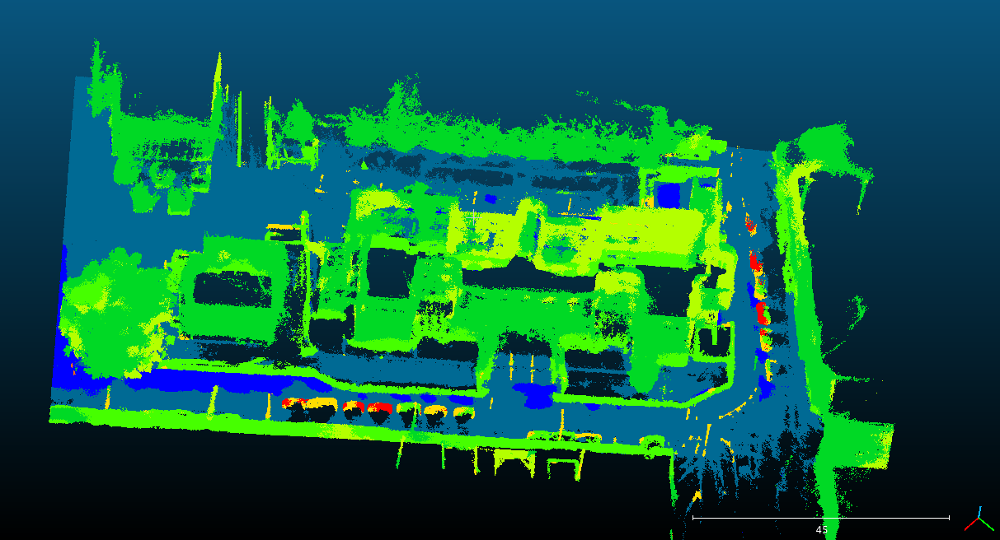

In [103]:
!python semantic3d_seg_fusion.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results/Fusion_8192pts --model_rgb ./results/SegBig_rgb --model_noc ./results/SegBig_nocolor --test --savepts

Creating the network...Done
Lecco_campus_1_xyzrgbr_voxels.npy
100%|███████████████████████████████████████| 792/792 [1:54:08<00:00,  8.65s/it]
(2847202, 3)
(2847202, 1)
2022-02-15 22:17:51.864908-Done.


**Result:**

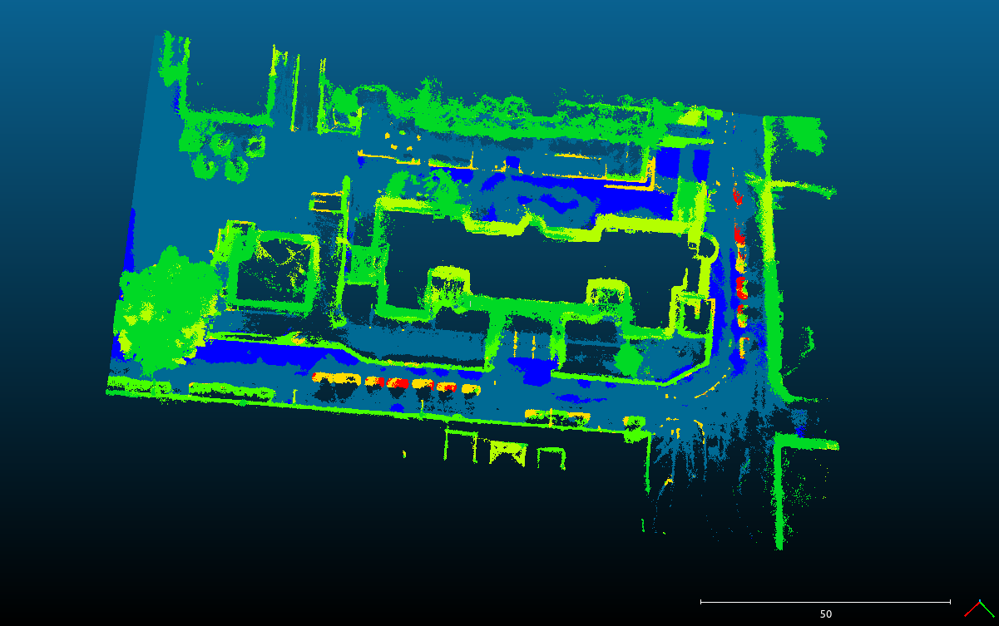

**Overall result:**

1. best ground model: ./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_08.npy_pts.txt

the stairs are correctly labelled as ground, and the low vegetabels are correctly extracted.


**Result (./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_08.npy_pts.txt):**

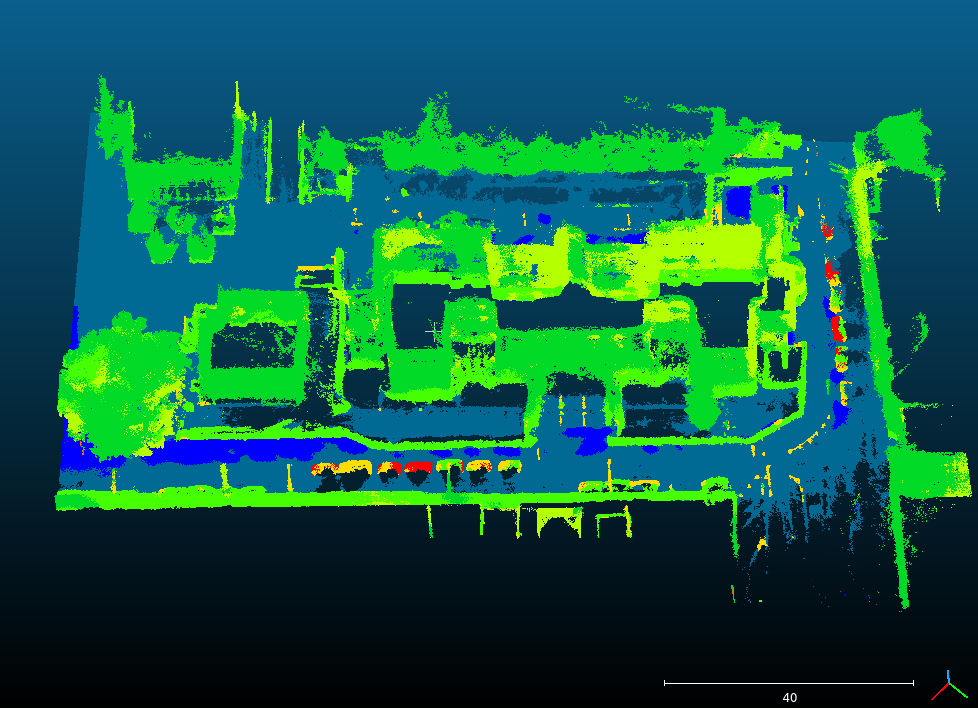

2. best building model: fusion model


**Result (./results/Fusion_8192pts/results/Lecco_campus_1_xyzi_registered.npy_pts.txt):**

Lecco_campus_1_xyzi_registered while test_step = 0.5:

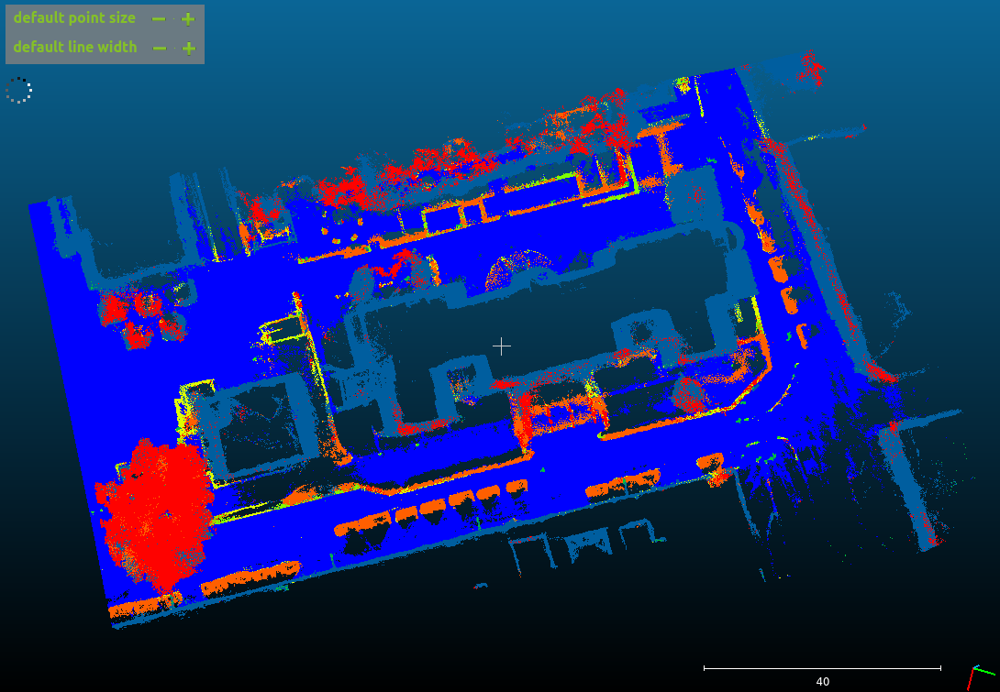

Lecco_campus_1_xyzi_registered while test_step = 0.4:
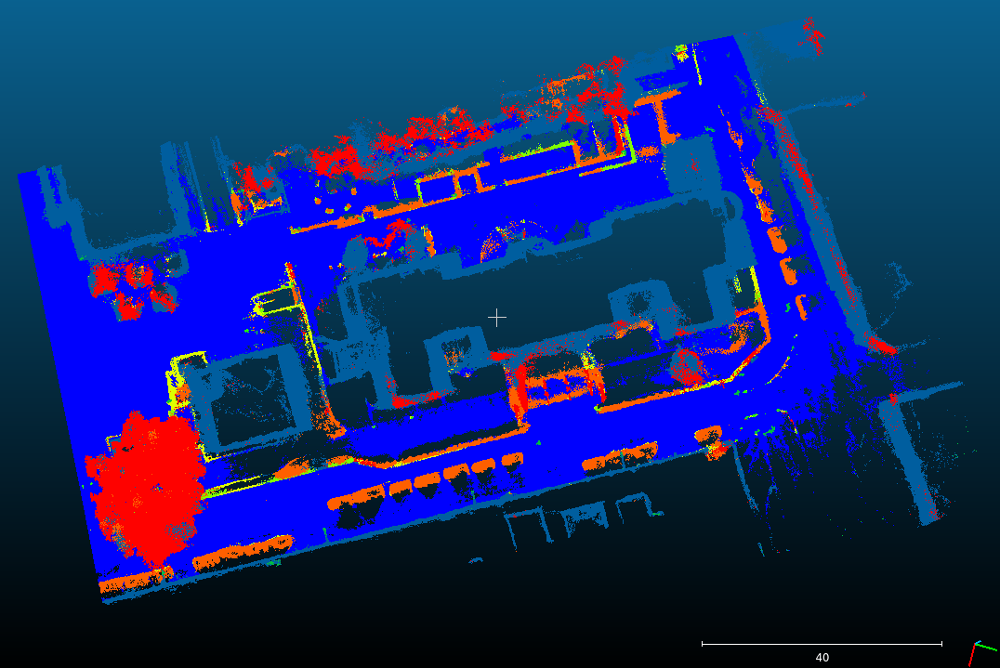


both are good.

3. best tree model:

**Result (./results/Fusion_8192pts/results/Lecco_campus_1_xyzi_registered.npy_pts.txt):**

Lecco_campus_1_xyzi_registered while test_step = 0.5:

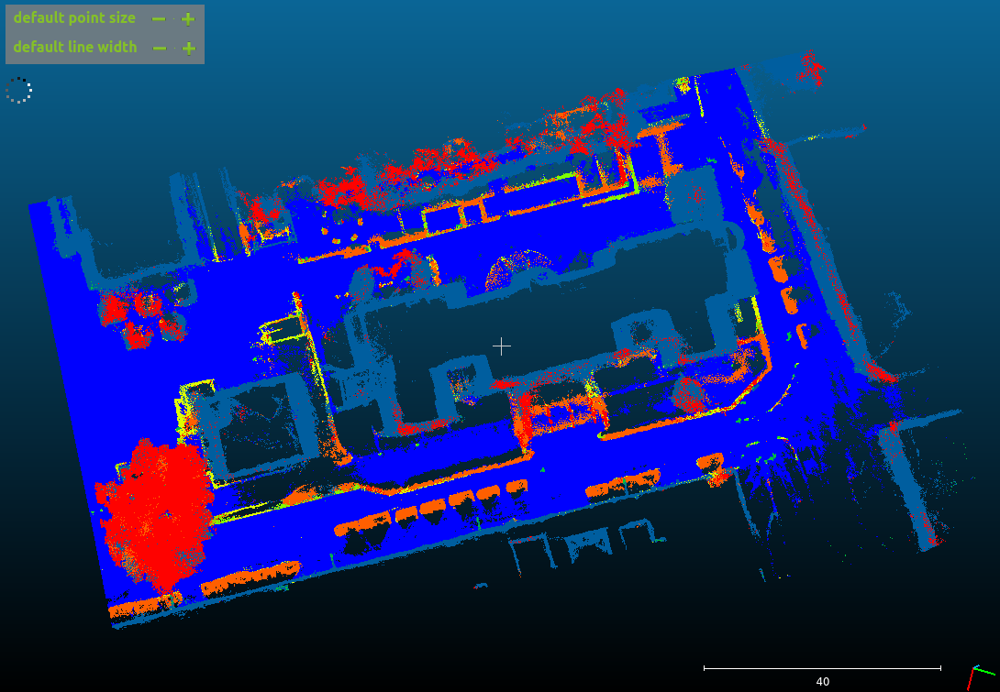

Lecco_campus_1_xyzi_registered while test_step = 0.4:
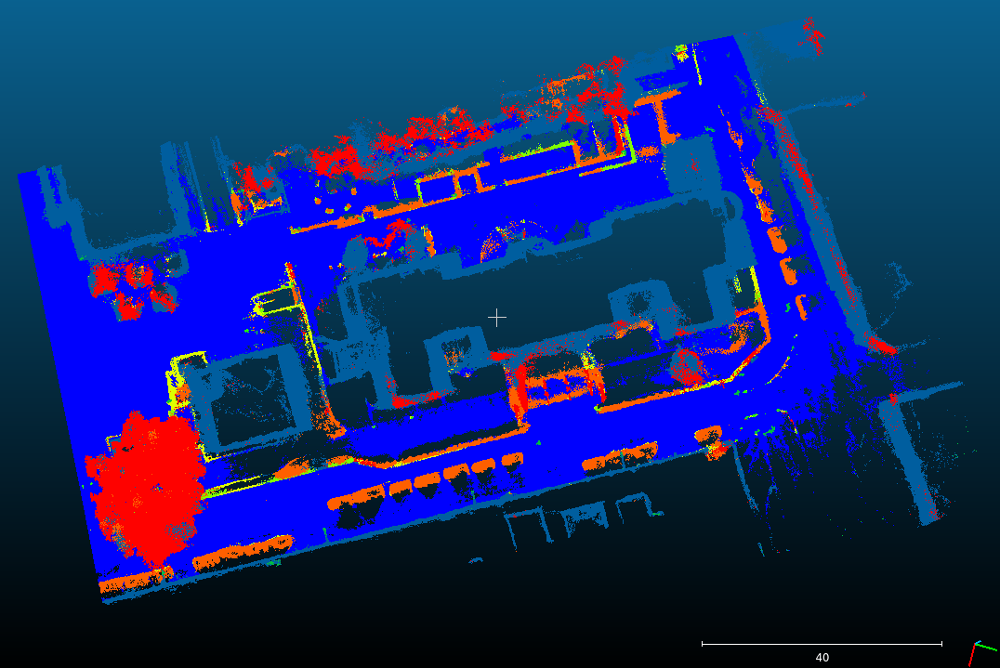


**Result (./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_08.npy_pts.txt):**

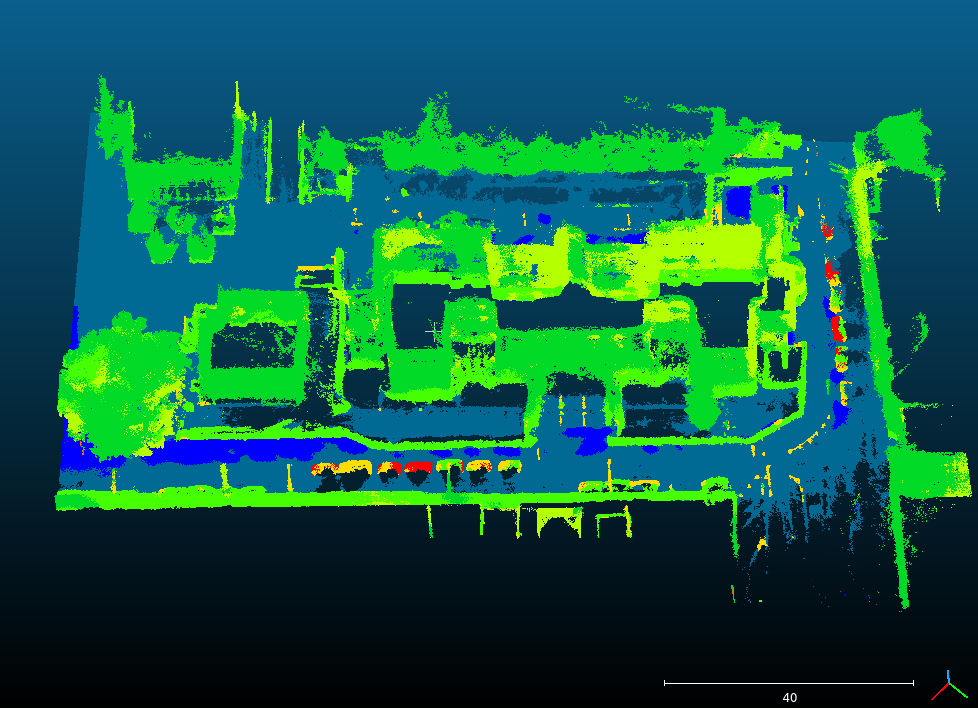


4. best car model:

Original:

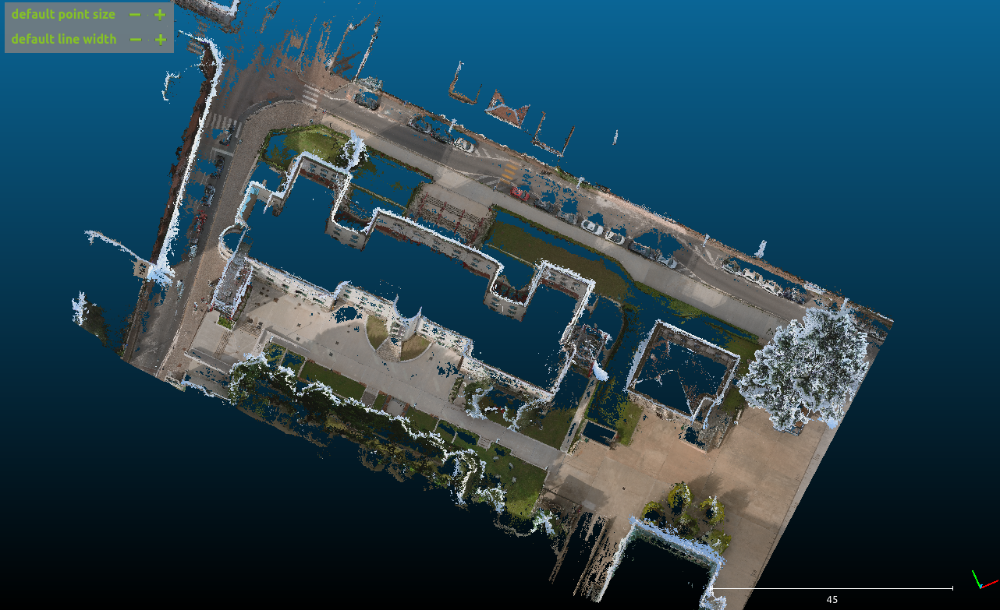


Lecco_campus_1_xyzi_registered while test_step = 0.5/0.4:

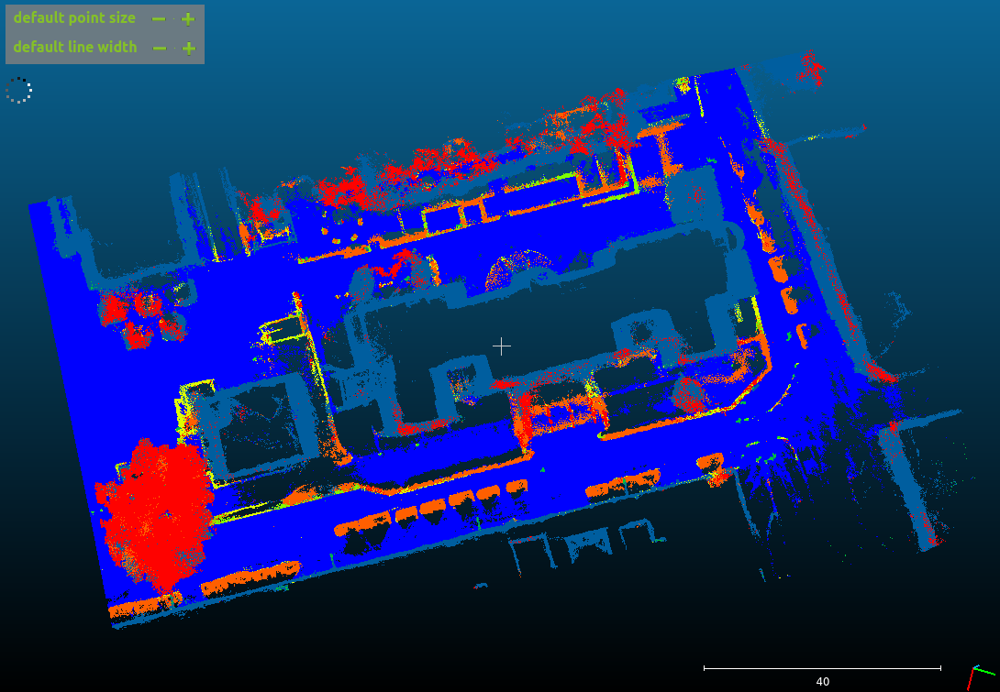

# Post-processing

## Mannually

use semantic3d extract ground -> low veg -> high veg

input: ./semantic3d/results/SegBig_rgb/results/Lecco_campus_1_xyzrgbr_voxels_step_08.npy_pts.txt
output: 

use fusion npm3d extract building -> car -> big tree -> others

merge all

**Result (post/Lecco_campus_1_04_08_merged_initial.asc):**

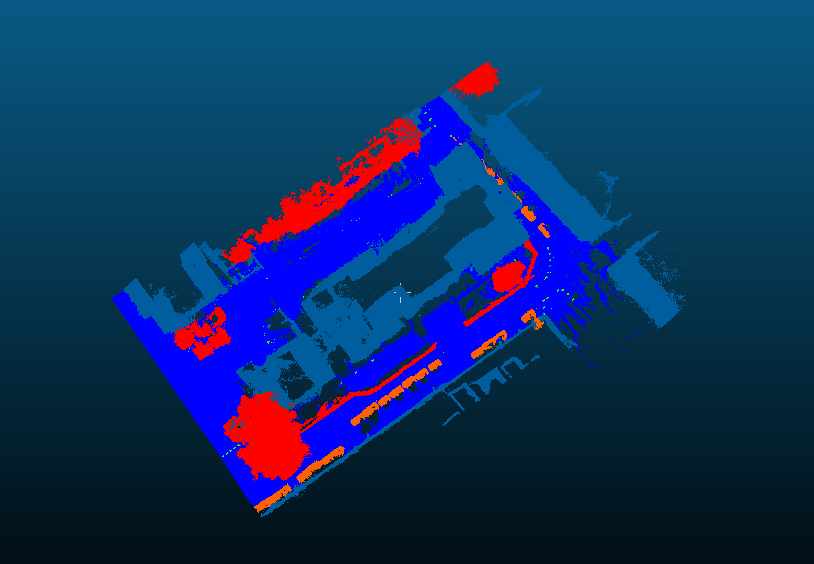

---

## Automatically Refine

Idea: choose part/whole of segmented test data as pseduo label, then use it to refine the pre-trained model, which is trained on semantic3d or npm3d. Lastly, use the refined model to test again

### 1. Choose a good segmented part and Segout 

**Result (post/refine/Lecco_campus_1_xyzi_registered_selected.ply):**

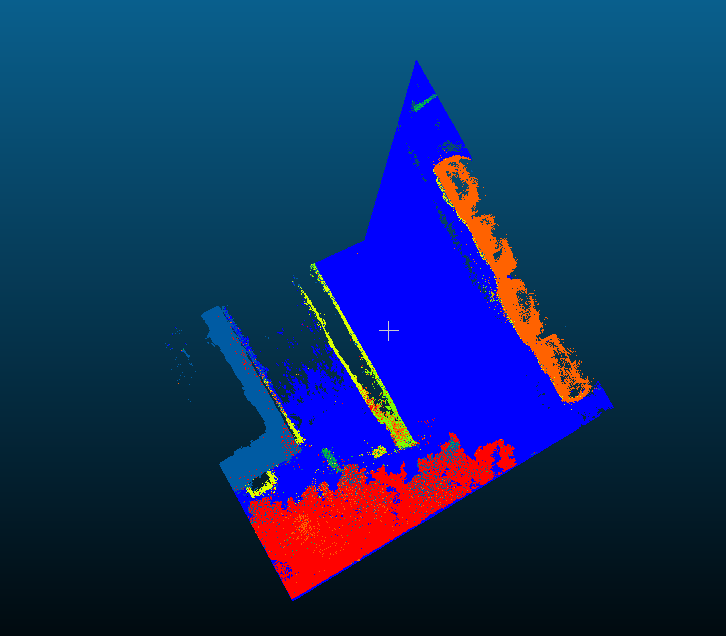

**Prepare**

In [5]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed

./data/refine/Lecco_campus_1_xyzi_registered_selected.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 21/02/2022 10:05
obj_info Generated by CloudCompare!
element vertex 2535110
property float x
property float y
property float z
property float scalar_Scalar_field
end_header


**Train**

In [7]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --nocolor --restore

Create filelist...done, 22 train files, 3 test files
Creating the network...Model with dropout
Restore pre-trained model...
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [2:03:48<00:00,  7.43s/it, AA=0.62059, IOU=0.48634, LOSS=1.6207e-06, OA=0
Epoch 1: 100%|█| 1000/1000 [1:55:11<00:00,  6.91s/it, AA=0.65635, IOU=0.51589, LOSS=1.2673e-06, OA=0
Epoch 2: 100%|█| 1000/1000 [2:02:42<00:00,  7.36s/it, AA=0.66407, IOU=0.58030, LOSS=1.2061e-06, OA=0
Epoch 3: 100%|█| 1000/1000 [1:56:02<00:00,  6.96s/it, AA=0.66810, IOU=0.58378, LOSS=1.1802e-06, OA=0
Epoch 4:   0%| | 5/1000 [00:35<1:54:48,  6.92s/it, AA=0.66901, IOU=0.57908, LOSS=1.2913e-06, OA=0.93^C


**Test**

In [9]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor_arch --test --savepts --nocolor

Create filelist...done, 22 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:37:40<00:00,  4.91s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result (examples/npm3d/results/SegBig_nocolor_selected/results/Lecco_campus_1_xyzi_registered.npy_pts.txt):**

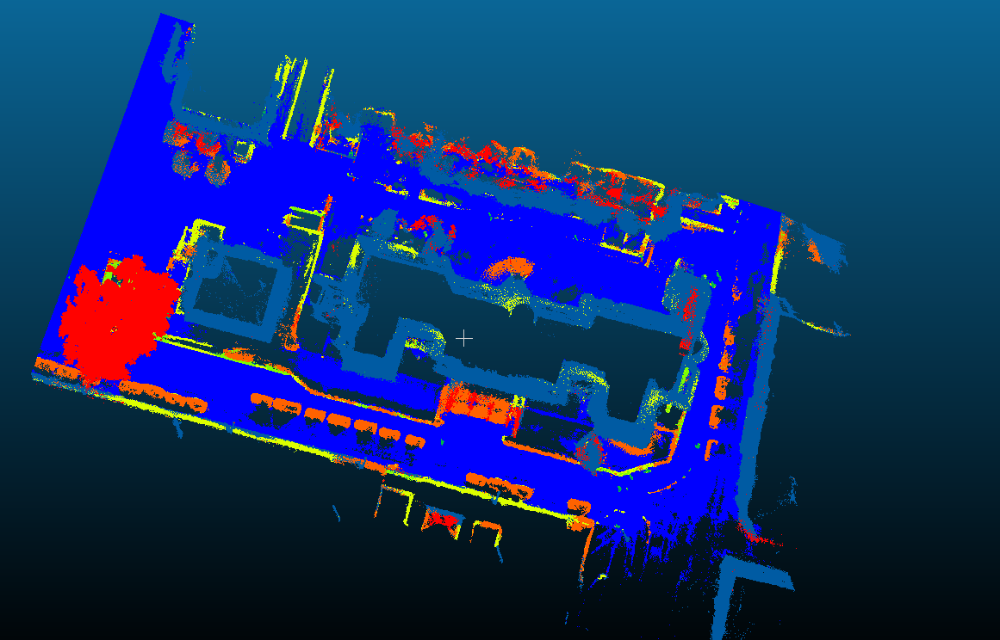

**Analysis:**

cons:
1. the builidngs on the bottom side
2. the trees on the top
3. the stairs classified to cars (maybe too many cars in the training data) 
4. small buildings

pros:
1. the trees on the bottom-left
2. the cars
3. ground

### 2. use **more part data** from fusion test result as training data in fine-tuning

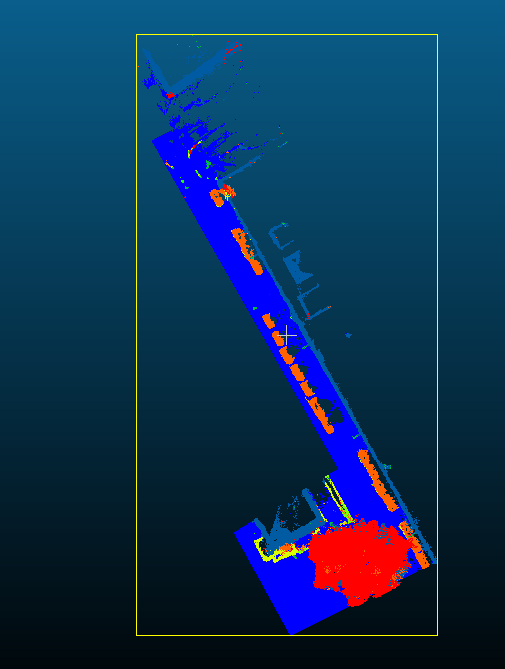

In [26]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed

./data/refine/Lecco_campus_1_part.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 23/02/2022 17:10
obj_info Generated by CloudCompare!
element vertex 15067460
property float x
property float y
property float z
property float scalar_Scalar_field
end_header


**Train**

In [3]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --nocolor --restore

Create filelist...done, 148 train files, 3 test files
Creating the network...Model with dropout
Restore pre-trained model...
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:49:28<00:00,  6.57s/it, AA=0.61512, IOU=0.49963, LOSS=1.0153e-06, OA=0
Epoch 1: 100%|█| 1000/1000 [1:48:33<00:00,  6.51s/it, AA=0.68839, IOU=0.55769, LOSS=6.6091e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:48:24<00:00,  6.50s/it, AA=0.70770, IOU=0.57641, LOSS=5.7193e-07, OA=0
Epoch 3:  12%| | 124/1000 [13:23<1:36:50,  6.63s/it, AA=0.70286, IOU=0.63688, LOSS=5.5160e-07, OA=0.^C


**Test_1 -> use output model of Epoch 1**

In [5]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor/SegBig_8192_nocolor_part --test --savepts --nocolor

Create filelist...done, 148 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:36:38<00:00,  4.88s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [6]:
!mv ./results/SegBig_nocolor/SegBig_8192_nocolor_part/results/Lecco_campus_1_xyzi_registered* ./results/SegBig_nocolor/SegBig_8192_nocolor_part/results/tt/

**Result (examples/npm3d/results/SegBig_8192_nocolor_part/results/tt/Lecco_campus_1_xyzi_registered.npy_pts_01.txt):**

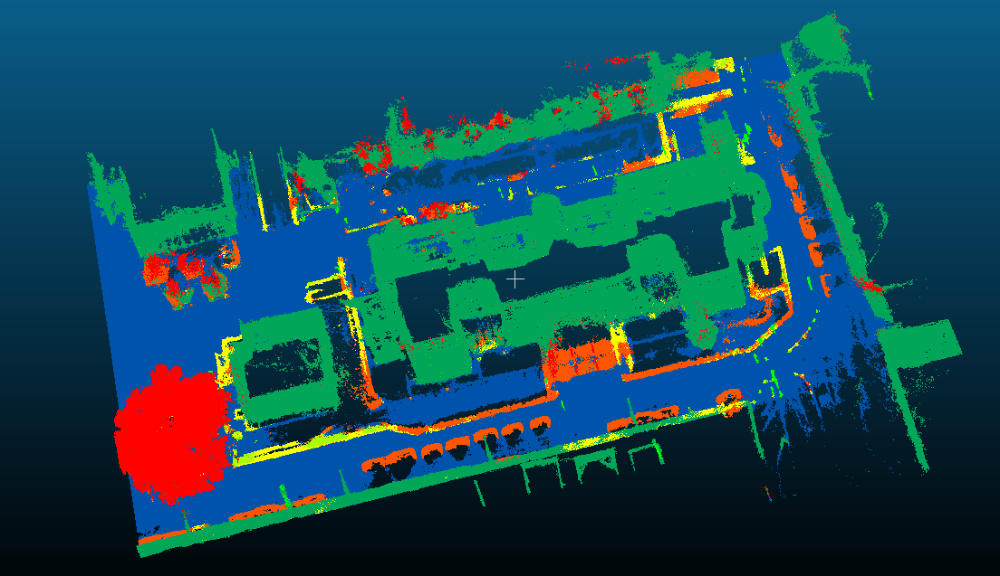

**Test_2 -> use output model of Epoch 2 (_02)**

In [7]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor/SegBig_8192_nocolor_part --test --savepts --nocolor

Create filelist...done, 148 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:35:03<00:00,  4.83s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


In [ ]:
!mv ./results/SegBig_nocolor/SegBig_8192_nocolor_part/results/Lecco_campus_1_xyzi_registered* ./results/SegBig_nocolor/SegBig_8192_nocolor_part/results/tt/

**Result(examples/npm3d/results/SegBig_8192_nocolor_part/results/tt/Lecco_campus_1_xyzi_registered.npy_pts_02.txt):**

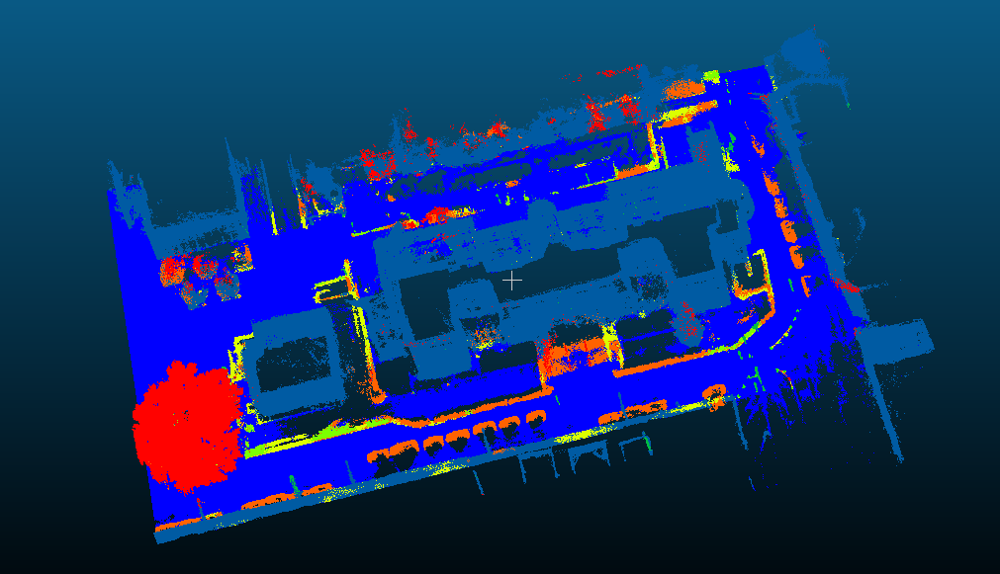

**Test_3 -> use output model of Epoch 3 (_new)**

In [8]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor/SegBig_8192_nocolor_part --test --savepts --nocolor

Create filelist...done, 148 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:45:58<00:00,  5.17s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result:**

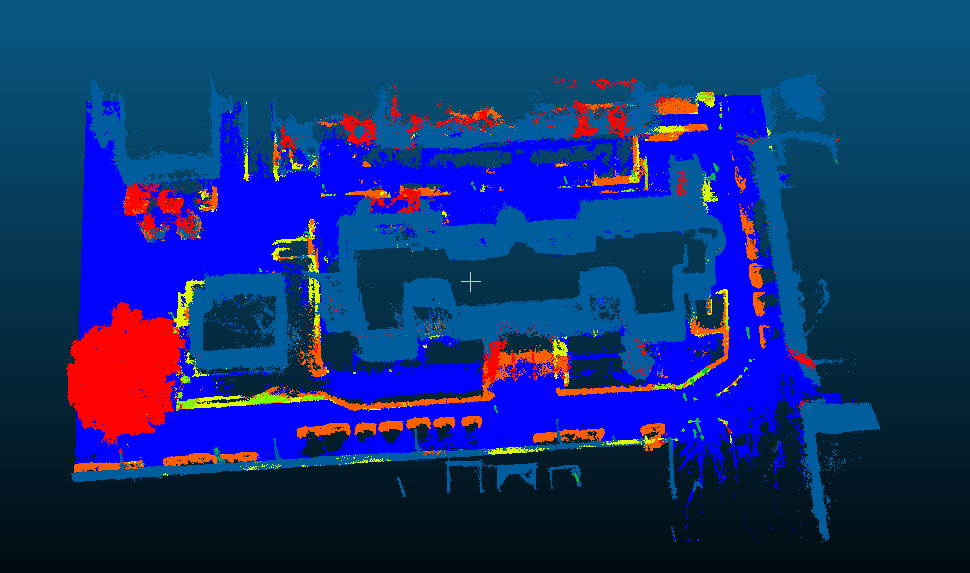

**Compare the result of different epoches:**

**Observation 1:**

The training process is early diverged...

As the training data used in refining stage is too small, no need to train too many epoches (How about add some training data in npm3d/semantic3d?)

**Observation 2:**

Tree part on the provided part is improved a lot
But the not provided part is very bad
reason:
- training data is a high tree, but others is low
- only one tree is provided

---

### 3. ADD **TREE** part as training data (tree part wasn't good)

**add tree in tested data**

In [11]:
!cp ./post-processing/test_step_02_combine/02_Lecco_campus_1_xyzi_registered_tree_ground_merged.ply ./data/refine/

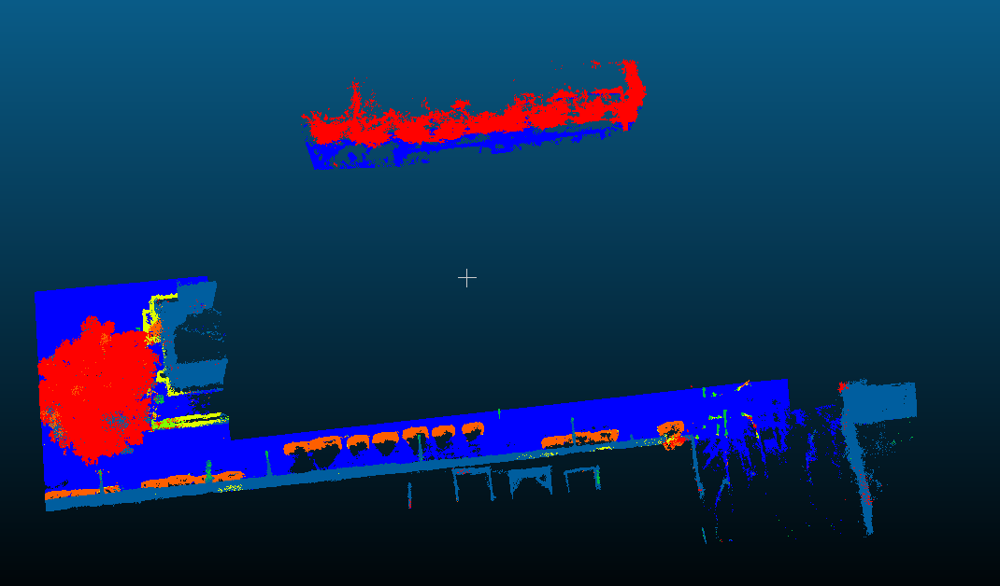

In [13]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed

./data/refine/Lecco_campus_1_part.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 23/02/2022 17:10
obj_info Generated by CloudCompare!
element vertex 15067460
property float x
property float y
property float z
property float scalar_Scalar_field
end_header
./data/refine/Lecco_campus_1_xyzi_registered_tree_ground_merged.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 12/02/2022 11:38
obj_info Generated by CloudCompare!
element vertex 1752005
property float x
property float y
property float z
property float scalar_Scalar_field
end_header


**Train**

In [14]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor --nocolor --restore --epochs 5

Create filelist...done, 162 train files, 3 test files
Creating the network...Model with dropout
Restore pre-trained model...
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:51:01<00:00,  6.66s/it, AA=0.60188, IOU=0.48989, LOSS=1.1232e-06, OA=0
Epoch 1: 100%|█| 1000/1000 [1:49:14<00:00,  6.55s/it, AA=0.68485, IOU=0.55903, LOSS=6.3643e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:47:08<00:00,  6.43s/it, AA=0.69541, IOU=0.63127, LOSS=5.9294e-07, OA=0
Epoch 3: 100%|█| 1000/1000 [1:47:40<00:00,  6.46s/it, AA=0.71646, IOU=0.65295, LOSS=5.1975e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:48:04<00:00,  6.48s/it, AA=0.72173, IOU=0.65966, LOSS=5.1890e-07, OA=0
2022-02-27 03:00:04.907084-Done.


**Test**

In [15]:
#use state_dict_1
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_8192_nocolor_tree --test --savepts --nocolor

Create filelist...done, 162 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:40:40<00:00,  5.01s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result (examples/npm3d/results/SegBig_8192_nocolor_tree/results/Lecco_campus_1_xyzi_registered.npy_pts_1.txt):**

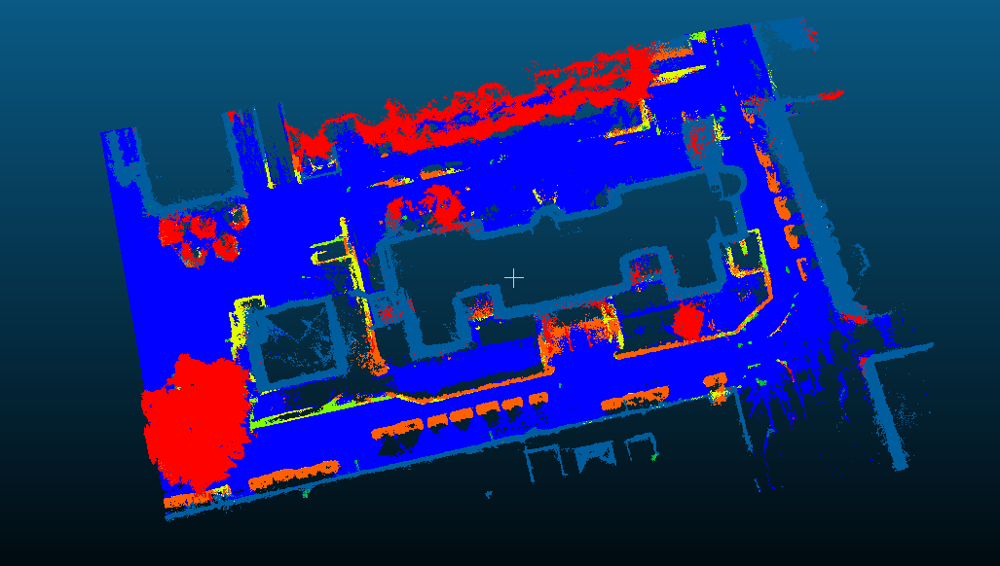

In [16]:
!mv ./results/SegBig_8192_nocolor_tree/results/Lecco_campus_1_xyzi_registered* ./results/SegBig_8192_nocolor_tree/results/tt/

In [17]:
#use state_dict_2
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_8192_nocolor_tree --test --savepts --nocolor

Create filelist...done, 162 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:37:32<00:00,  4.91s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result (examples/npm3d/results/SegBig_8192_nocolor_tree/results/Lecco_campus_1_xyzi_registered_2.npy):**

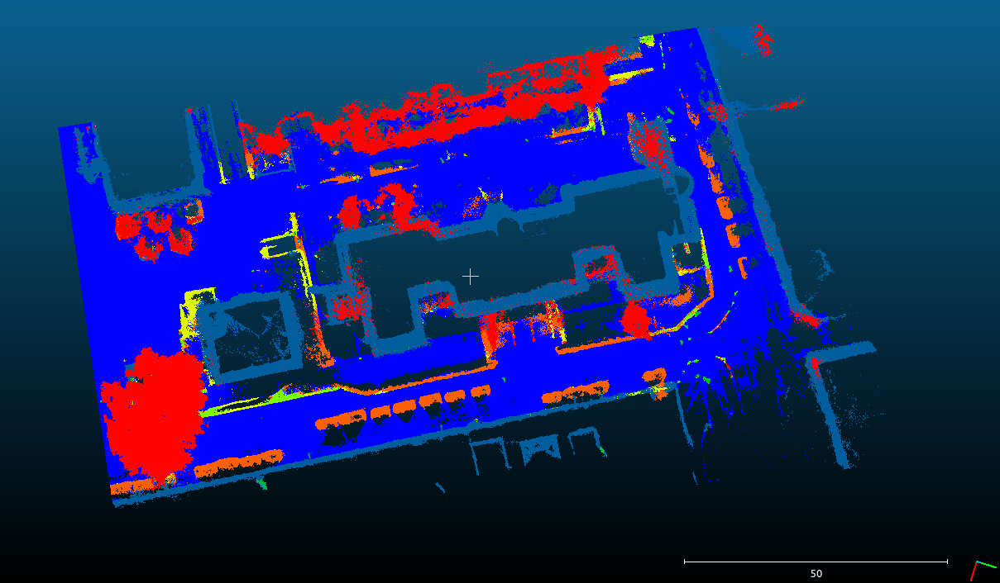

In [18]:
#use state_dict_3
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_8192_nocolor_tree --test --savepts --nocolor

Create filelist...done, 162 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:42:48<00:00,  5.07s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 392, in <module>
    main()
  File "npm3d_seg.py", line 347, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result (examples/npm3d/results/SegBig_8192_nocolor_tree/results/Lecco_campus_1_xyzi_registered_3.npy):**

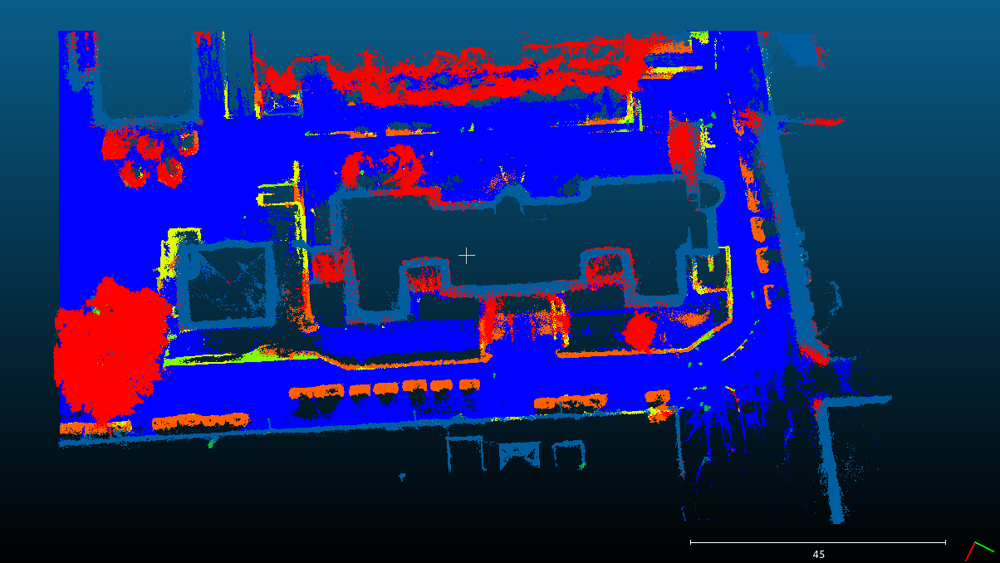

**Compare the result of different epoches:**

**Observation 1:**

The training process is early diverged...

As the training data used in refining stage is too small, no need to train too many epoches (How about add some training data in npm3d/semantic3d?)

**Observation 2:**

Tree part on the provided part is improved a lot
But the not provided part is very bad
reason:
- training data is a high tree, but others is low
- only one tree is provided

---



---

### 4. use **merged full data** (./data/refine/Lecco_campus_1_04_08_merged_initial.ply) as training data in fine-tuning

**Merged data (post/Lecco_campus_1_04_08_merged_initial.asc):**

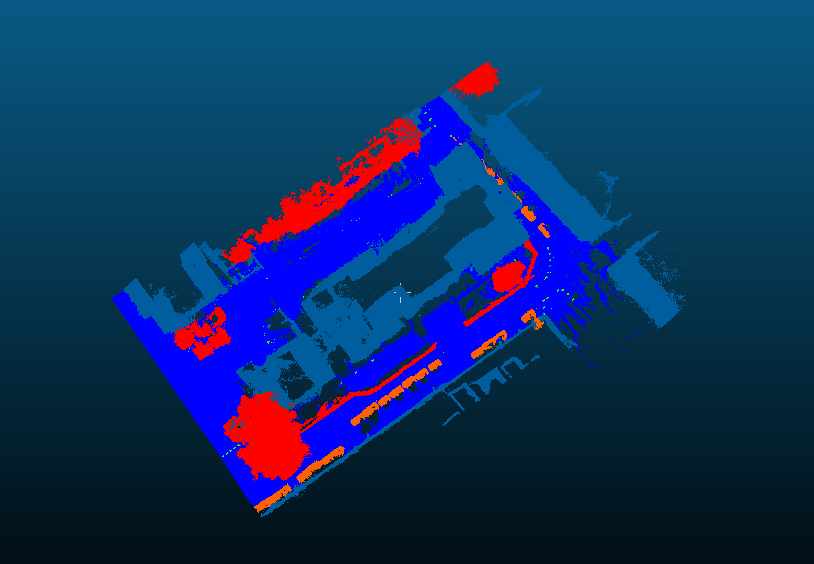

In [19]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed

./data/refine/Lecco_campus_1_04_08_merged_initial.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 22/02/2022 08:54
obj_info Generated by CloudCompare!
element vertex 27511021
property float x
property float y
property float z
property float scalar_Scalar_field
end_header


Train

In [10]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor_merge --nocolor --restore

Create filelist...done, 272 train files, 3 test files
Creating the network...Model with dropout
Restore pre-trained model...
Create the datasets...Done
Create optimizer...Done
Epoch 3: 100%|█| 1000/1000 [1:50:48<00:00,  6.65s/it, AA=0.91601, IOU=0.54568, LOSS=2.6445e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:49:05<00:00,  6.55s/it, AA=0.94339, IOU=0.90892, LOSS=1.8559e-07, OA=0
Epoch 5: 100%|█| 1000/1000 [1:49:45<00:00,  6.59s/it, AA=0.94823, IOU=0.91535, LOSS=1.9192e-07, OA=0
Epoch 6: 100%|█| 1000/1000 [1:50:06<00:00,  6.61s/it, AA=0.95348, IOU=0.92226, LOSS=1.7056e-07, OA=0
Epoch 7: 100%|█| 1000/1000 [1:50:31<00:00,  6.63s/it, AA=0.95351, IOU=0.92426, LOSS=1.4953e-07, OA=0
Epoch 8: 100%|█| 1000/1000 [1:51:33<00:00,  6.69s/it, AA=0.95457, IOU=0.92449, LOSS=1.5400e-07, OA=0
Epoch 9:  58%|▌| 584/1000 [1:04:51<47:15,  6.82s/it, AA=0.95227, IOU=0.92190, LOSS=1.5086e-07, OA=0.^C


In [ ]:
!mv ./results/SegBig_nocolor/SegBig_8192_nocolorTrue_drop0.5_2022-02-28-10-47-24/* ./results/SegBig_nocolor_merge/

In [3]:
cd examples/npm3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/npm3d


Test

In [5]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor_merge --test --savepts --nocolor --test_epoch 0

Create filelist...done, 272 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [2:36:40<00:00,  4.88s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 393, in <module>
    main()
  File "npm3d_seg.py", line 348, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result:**

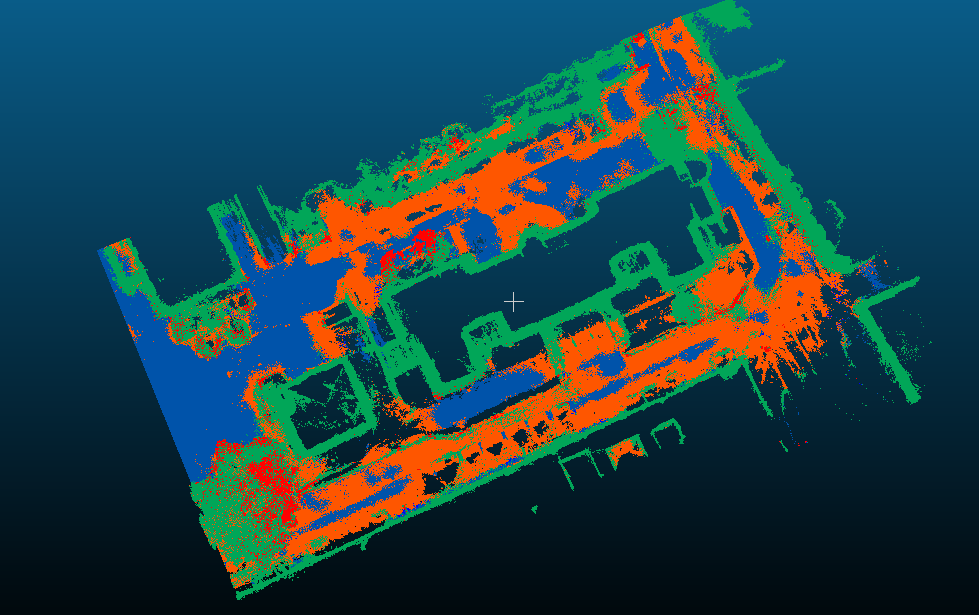

In [6]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor_merge --test --savepts --nocolor --test_epoch 1

Create filelist...done, 272 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [3:20:30<00:00,  6.25s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 393, in <module>
    main()
  File "npm3d_seg.py", line 348, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result:**

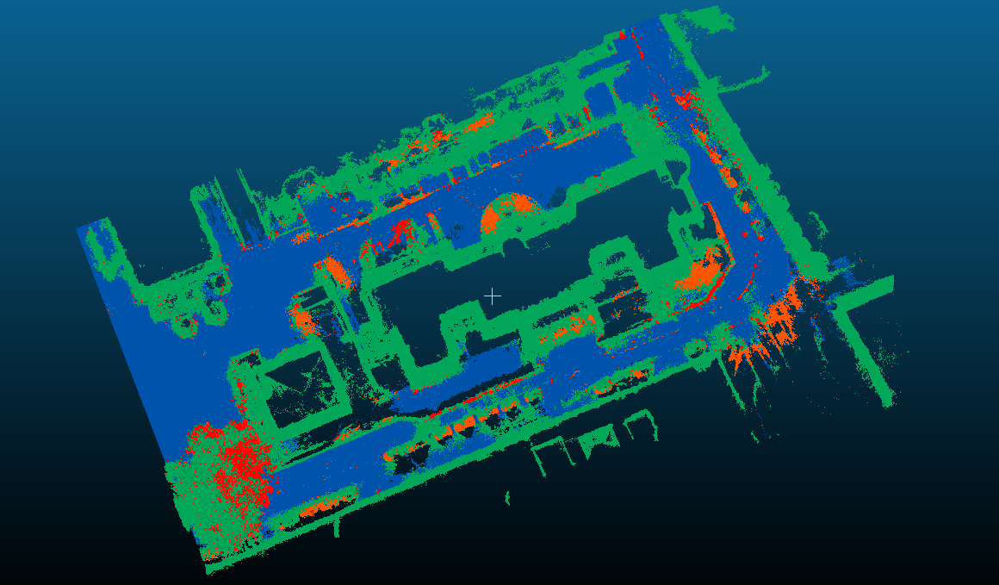

In [7]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results/SegBig_nocolor_merge --test --savepts --nocolor --test_epoch 2

Create filelist...done, 272 train files, 3 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Lecco_campus_1_xyzi_registered.npy
100%|█████████████████████████████████████| 1926/1926 [3:14:36<00:00,  6.06s/it]
Computing neighbors
(49746942, 3)
(49746942, 1)
Done
tt
Traceback (most recent call last):
  File "npm3d_seg.py", line 393, in <module>
    main()
  File "npm3d_seg.py", line 348, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/tt'


**Result**

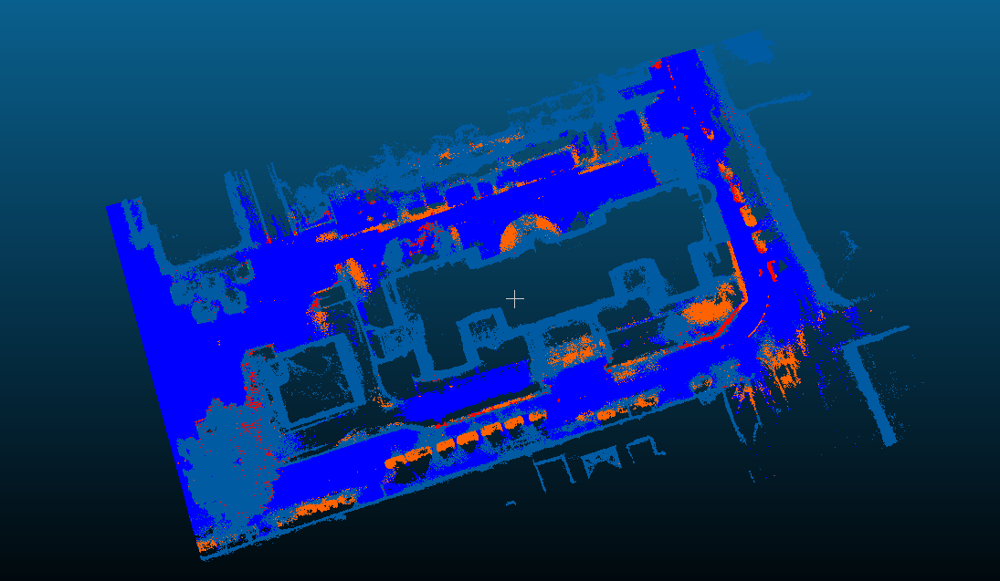

# Thinking: How to be more automatical?

How about 

-> add a confidence value (e.g., semantic score as confidence of the prediction) 

-> select qualified predictions while confidence value >= lamda (confidence threshold) as psedo label

-> fine-tuning 

-> test

# Agliate data

## Pre-trainied model use NPM3D as training data

In [1]:
cd examples/npm3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/npm3d


In [10]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed --test

./data/test_10_classes/Agliate_2_xyzirgbr.ply
ply
format binary_little_endian 1.0
element vertex 102511682
property double x
property double y
property double z
property float intensity
property char red
property char green
property char blue
end_header
./data/test_10_classes/Agliate_2_xyzoirgbr.ply
ply
format binary_little_endian 1.0
element vertex 102511682
property double x
property double y
property double z
property float intensity
property char red
property char green
property char blue
end_header


### use nocolor model

In [4]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results02/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 272 train files, 2 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Agliate_2_xyzoirgbr.npy
100%|█████████████████████████████████████| 4135/4135 [9:44:19<00:00,  8.48s/it]
Computing neighbors...
(102511682, 3)
(102511682, 1)
Done
Saving results...
output point cloud saved at ./results02/SegBig_nocolor
Agliate_2_xyzirgbr.npy
 38%|█████████████▏                     | 1565/4135 [3:40:56<7:20:31, 10.28s/it]^C


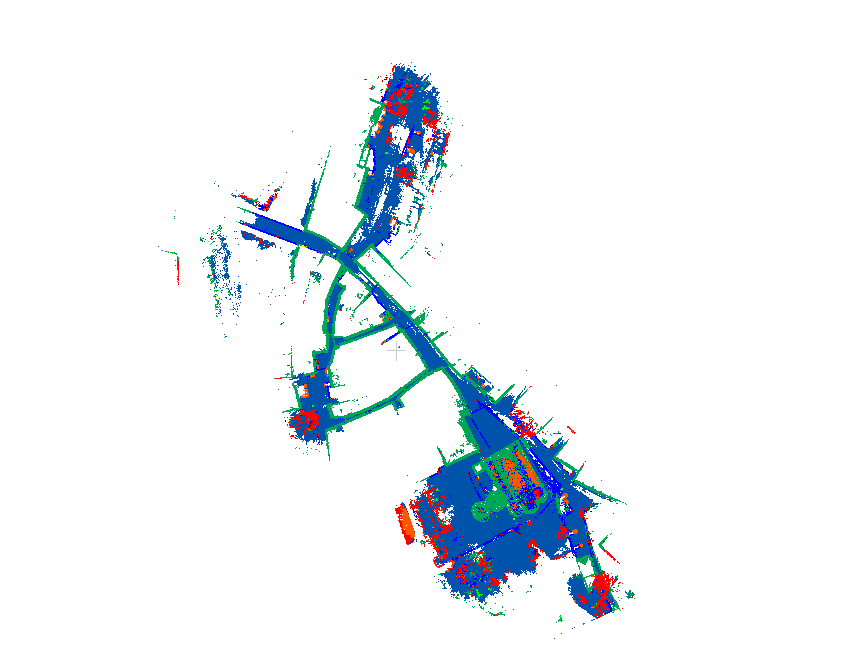

### use intensity feature

In [2]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results02/SegBig_intensity --test --savepts

Create filelist...done, 272 train files, 2 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Agliate_2_xyzoirgbr.npy
100%|████████████████████████████████████| 4135/4135 [10:29:44<00:00,  9.14s/it]
Computing neighbors...
(102511682, 3)
(102511682, 1)
Done
Saving results...
output point cloud saved at ./results02/SegBig_intensity
Agliate_2_xyzirgbr.npy
100%|████████████████████████████████████| 4135/4135 [10:27:56<00:00,  9.11s/it]
Computing neighbors...
(102511682, 3)
(102511682, 1)
Done
Saving results...
output point cloud saved at ./results02/SegBig_intensity
2022-03-08 06:19:30.330088-Done.


---

Agliate_2_xyzirgbr.npy <br>
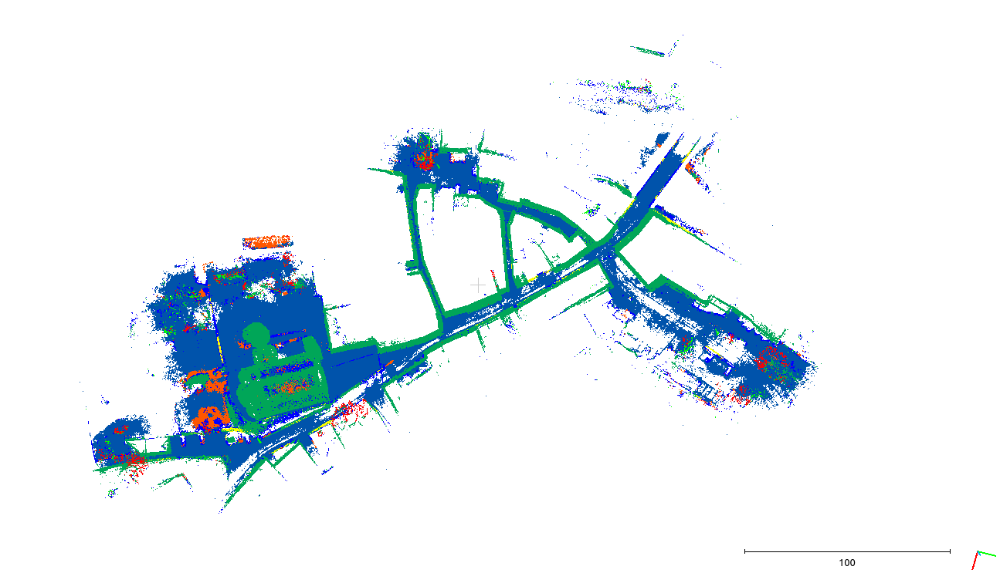
<br>

---

Agliate_2_xyzorgbr.npy <br>
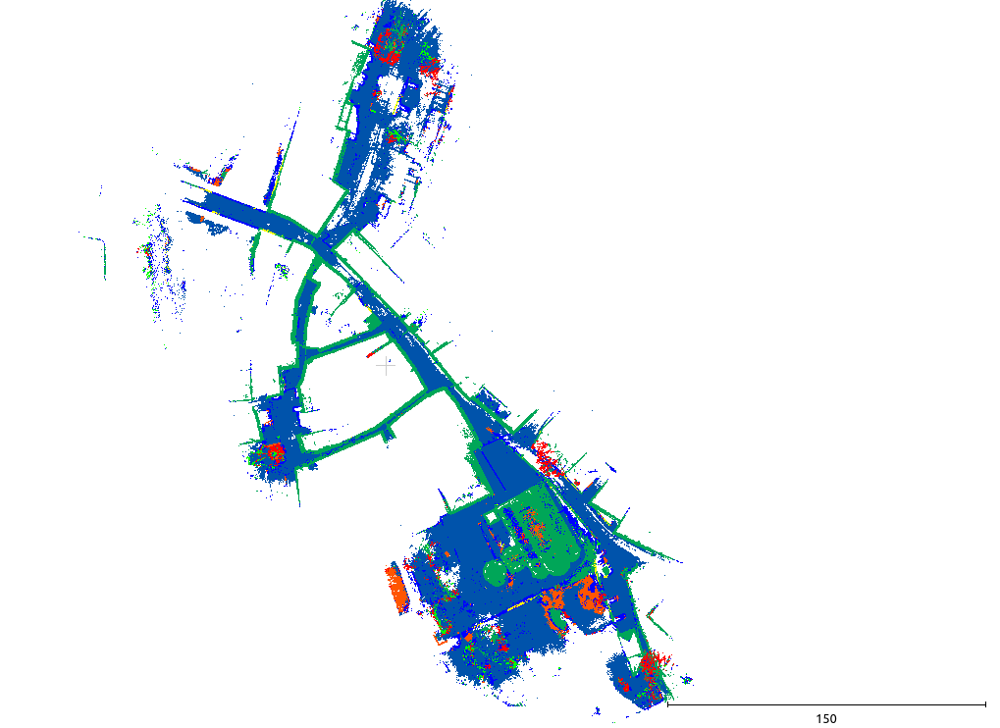

### use fusion model

In [3]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results02/Fusion_8192pts --model_rgb ./results02/SegBig_intensity --model_noc ./results02/SegBig_nocolor --test --savepts

Create filelist...done, 272 train files, 2 test files
Creating the network...Done
Agliate_2_xyzoirgbr.npy
100%|█████████████████████████████████████| 1783/1783 [6:39:58<00:00, 13.46s/it]
(102511682, 3)
(102511682, 1)
1 9
Agliate_2_xyzirgbr.npy
100%|█████████████████████████████████████| 1783/1783 [6:15:22<00:00, 12.63s/it]
(102511682, 3)
(102511682, 1)
1 9
2022-03-08 19:33:44.685727-Done.


---

Agliate_2_xyzirgbr.npy<br>

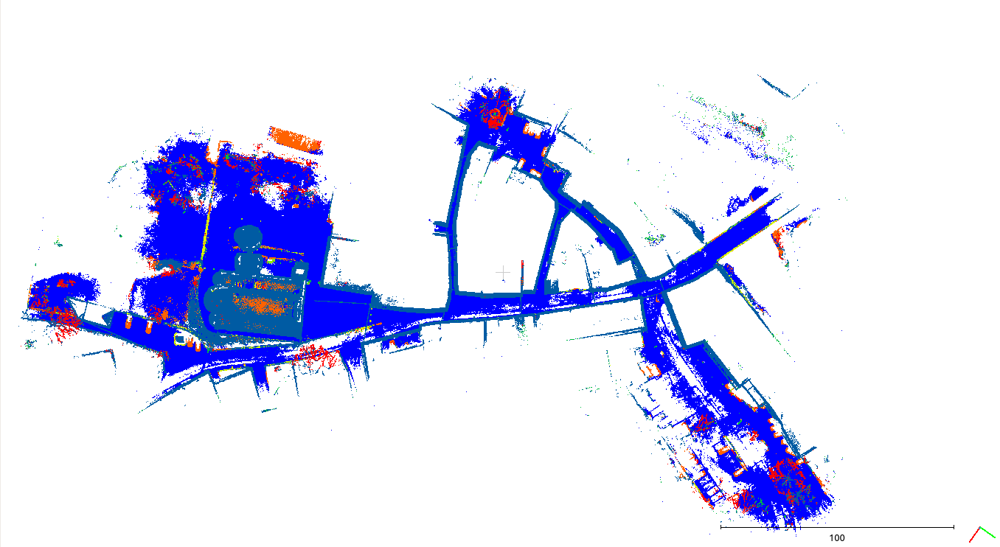

---

Agliate_2_xyzoirgbr.npy <br>
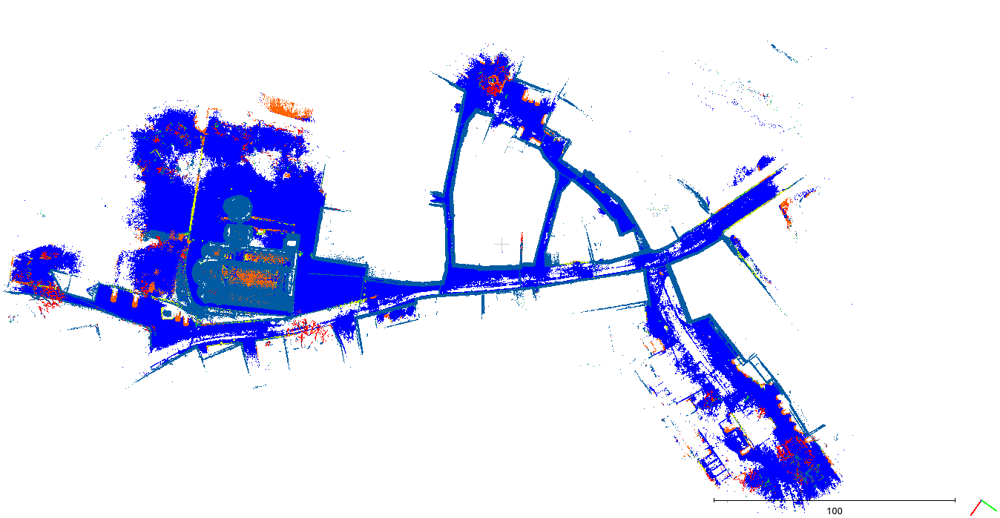

observe: xyzirgb performance better than xyzoirgr

---


## pre-trained model use semantic3d as training data

Semantic3D: {
1: 'man-made terrain',
2: 'natural terrain',
3: 'high vegetation',
4: 'low vegetation',
5: 'buildings',
6: 'hard scape',
7: 'scanning artefacts',
8: 'cars'}

In [6]:
cd ../semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


### use rgb feature

#### original data

In [10]:
!python semantic3d_prepare_data.py --rootdir ./data

Creating train directories...done
Generating test files...
Agliate_2_xyzrgbr
102.5M points loaded
Done


In [ ]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_rgb --test --savepts

Creating the network...Model with dropout <br>
Done <br>
Agliate_2_xyzrgbr_voxels.npy <br>
100%|█████████████████████████████████████| 1779/1779 [1:33:11<00:00,  3.14s/it] <br>
(3456927, 3) <br>
(3456927, 1)<br>
2022-03-09 2022 22∶47∶44-Done.

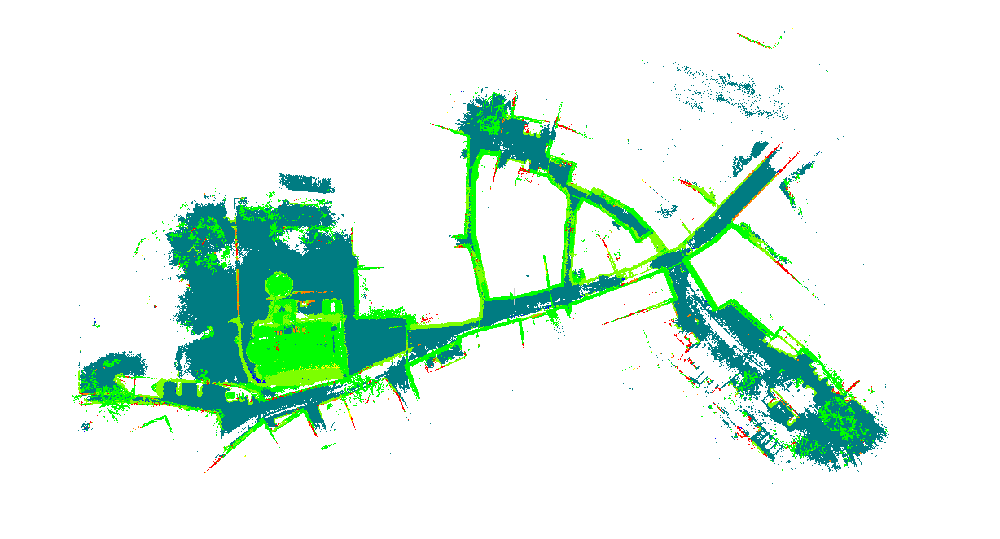

#### aligned data to s3mantic3d

In [12]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_rgb --test --savepts

Creating the network...Model with dropout
Done
Agliate_2_xyzrgbr_voxels.npy
100%|█████████████████████████████████████| 1782/1782 [1:29:38<00:00,  3.02s/it]
(3463475, 3)
(3463475, 1)
2022-03-09 22:33:49.264359-Done.


In [51]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_rgb --test --savepts

Creating the network...Model with dropout
Done
Agliate_1_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 2098/2098 [1:54:46<00:00,  3.28s/it]
(4175030, 3)
(4175030, 1)
Agliate_2_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1780/1780 [1:30:57<00:00,  3.07s/it]
(3447322, 3)
(3447322, 1)
Bassano_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1325/1325 [1:05:48<00:00,  2.98s/it]
(3352984, 3)
(3352984, 1)
2022-03-12 19:23:28.304836-Done.


Very bad result, cann't use rgb in this model

In [19]:
!python semantic3d_prepare_data.py --rootdir ./data

Creating train directories...done
Generating test files...
Agliate_2_xyzoirgb_aligned
102.5M points loaded
Done


In [23]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_rgb --test --savepts

Creating the network...Model with dropout
Done
Agliate_2_xyzoirgb_aligned_voxels.npy
100%|█████████████████████████████████████| 1779/1779 [1:33:11<00:00,  3.14s/it]
(3456927, 3)
(3456927, 1)
2022-03-10 12:45:54.743535-Done.


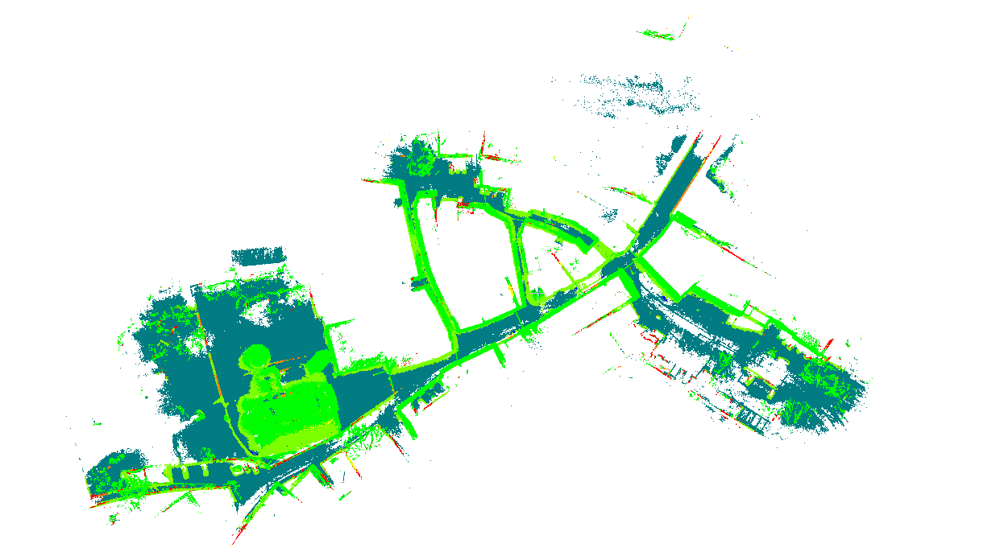

In [15]:
!python semantic3d_prepare_data.py --rootdir ./data

Creating train directories...done
Generating test files...
Agliate_2_xyzrgbr_aligned
102.5M points loaded
Done


### nocolor model

#### original data

In [13]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_2_xyzrgbr_voxels.npy
100%|█████████████████████████████████████| 1782/1782 [1:32:58<00:00,  3.13s/it]
(3463475, 3)
(3463475, 1)
2022-03-10 00:07:12.867230-Done.


Agliate_2_xyzrgbr_voxels.npy <br>
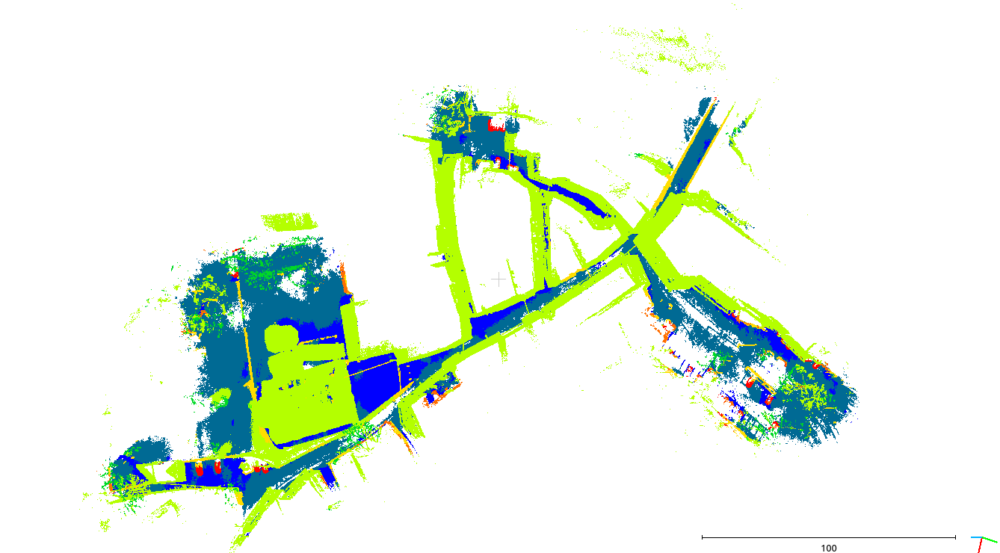

**very good result
try to use Agliate_1 (maybe more dense)**

---

#### aligned data

In [17]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_2_xyzrgbr_aligned_voxels.npy
100%|█████████████████████████████████████| 1779/1779 [1:39:54<00:00,  3.37s/it]
(3456927, 3)
(3456927, 1)
2022-03-10 10:59:26.609615-Done.


Agliate_2_xyzrgbr_aligned_voxels.npy<br>
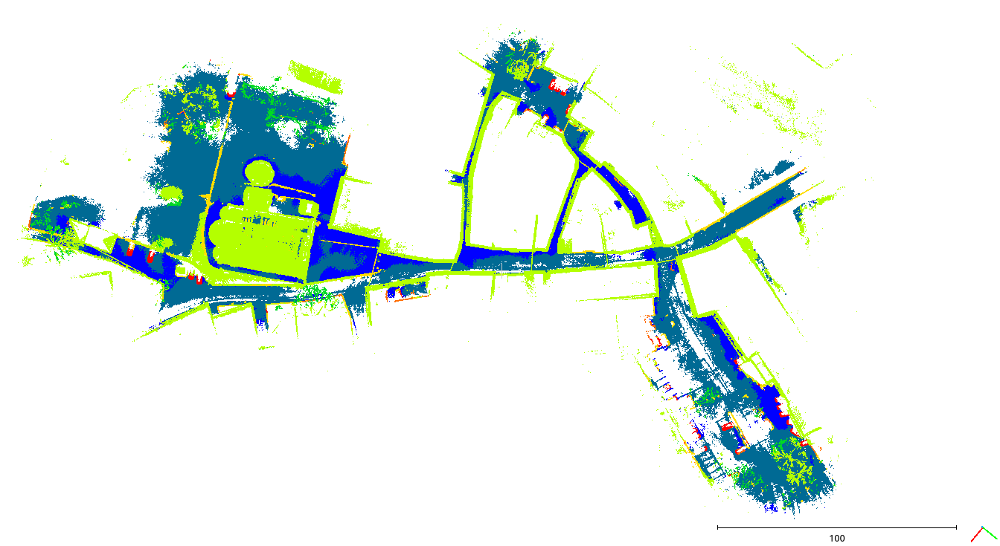

result: not too much difference

---

#### adjust knn

##### K=1

In [ ]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Agliate_1_xyznirgb_aligned_voxels.npy
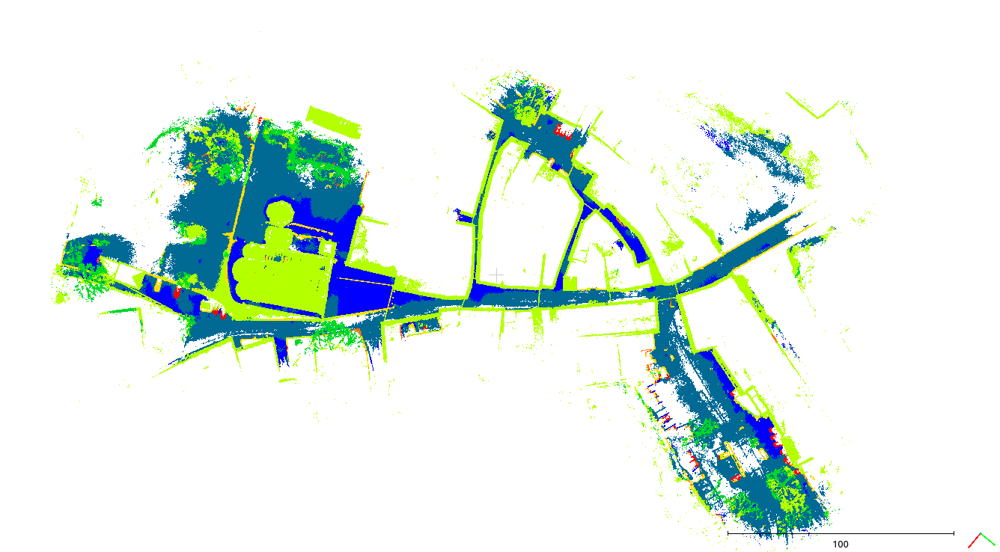

---

Agliate_2_xyznirgb_aligned_voxels.npy
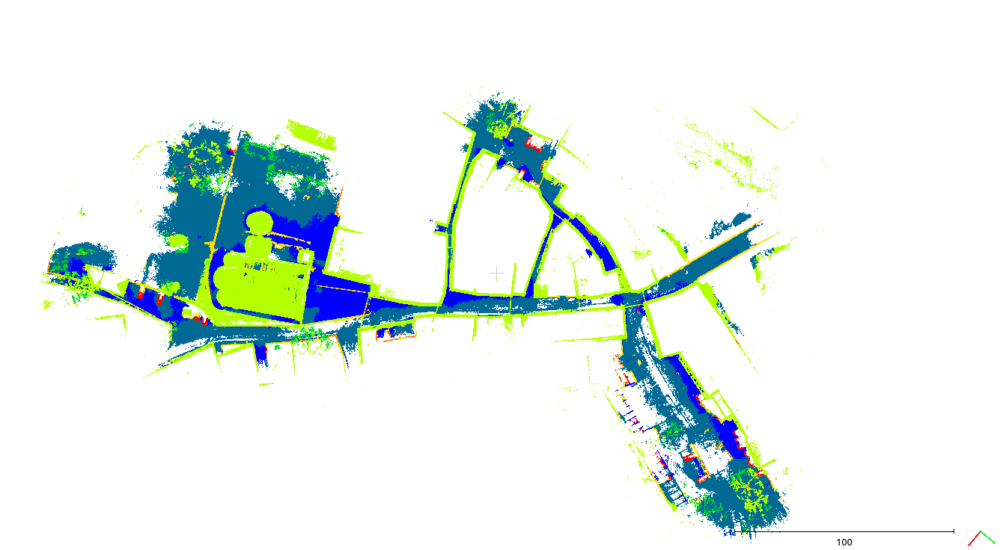

##### K=5

In [27]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_2_xyzoirgb_aligned_voxels.npy
100%|█████████████████████████████████████| 1779/1779 [1:37:08<00:00,  3.28s/it]
(3456927, 3)
(3456927, 5)
2022-03-10 21:43:54.274411-Done.


Agliate_2_xyzoirgb_aligned_voxels_k5.npy <br>
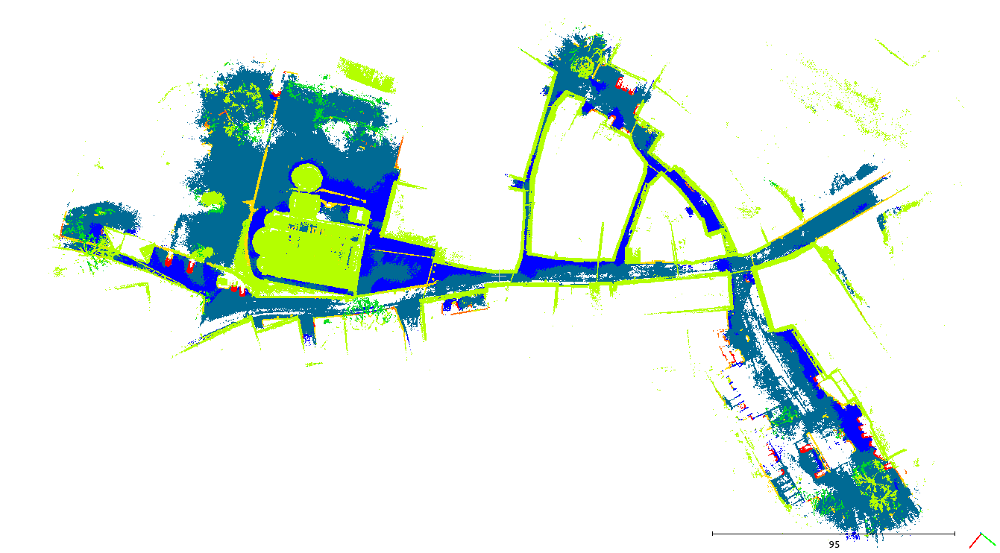

Result: not obvious change

##### K=16

In [50]:
!python semantic3d_seg_k16.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_1_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 2098/2098 [1:55:13<00:00,  3.30s/it]
(4175030, 3)
(4175030, 16)
Agliate_2_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1780/1780 [1:31:50<00:00,  3.10s/it]
(3447322, 3)
(3447322, 16)
Bassano_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1325/1325 [1:08:17<00:00,  3.09s/it]
(3352984, 3)
(3352984, 16)
2022-03-12 14:50:42.187395-Done.


Agliate_1_xyznirgb_voxels.npy
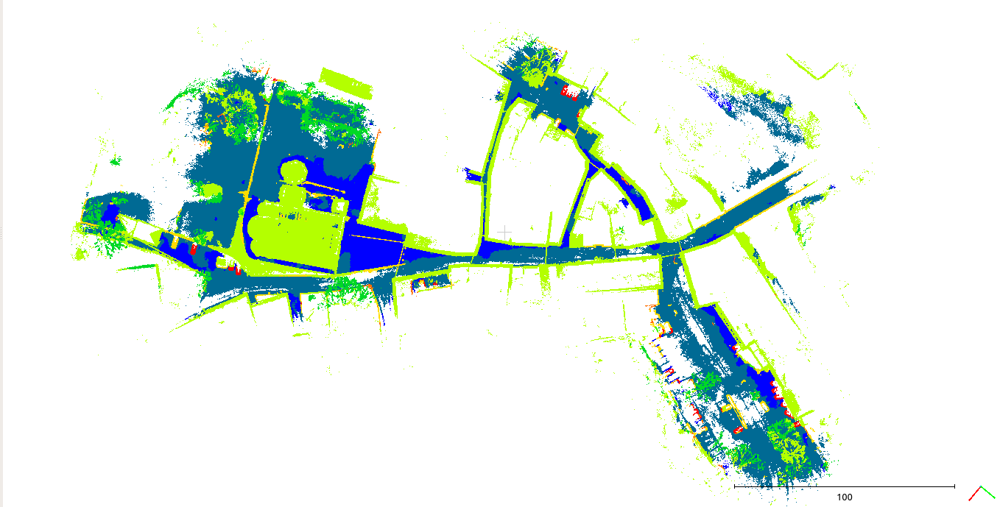

---
Agliate_2_xyznirgb_voxels.npy
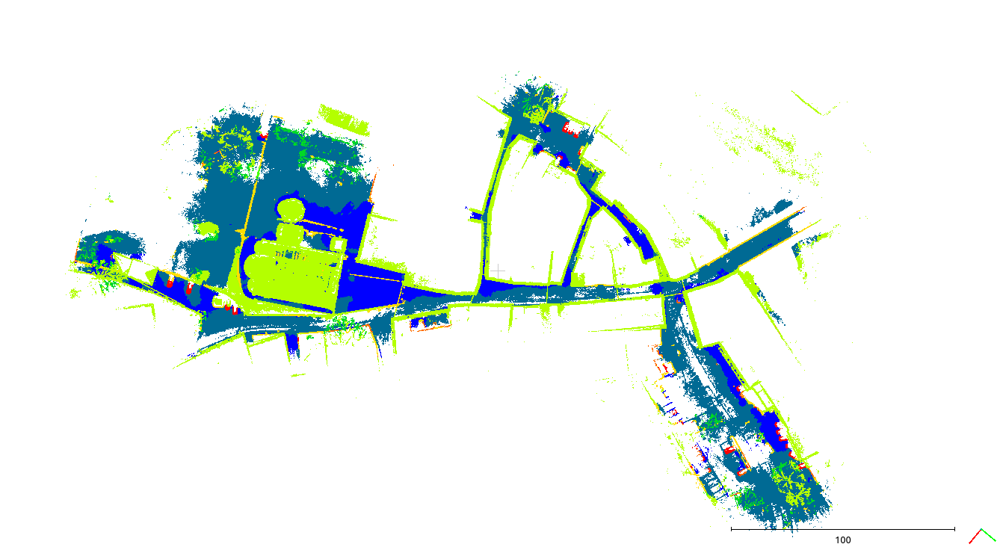
<br>
Result:

---


##### k=32

In [ ]:
!python semantic3d_seg_k32.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout <br>
Done <br>
Agliate_1_xyznirgb_voxels.npy <br>
100%|█████████████████████████████████████| 2098/2098 [1:55:13<00:00,  3.30s/it] <br>
(4175030, 3)<br>
(4175030, 16) <br>
Agliate_2_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1780/1780 [1:31:50<00:00,  3.10s/it]<br>
(3447322, 3)<br>
(3447322, 16)<br>
Bassano_xyznirgb_voxels.npy<br>
100%|█████████████████████████████████████| 1325/1325 [1:08:17<00:00,  3.09s/it]<br>
(3352984, 3)<br>
(3352984, 16)<br>
Sun 13 Mar 2022 04∶21∶57 CET-Done.

Agliate_1_xyznirgb_voxels.npy
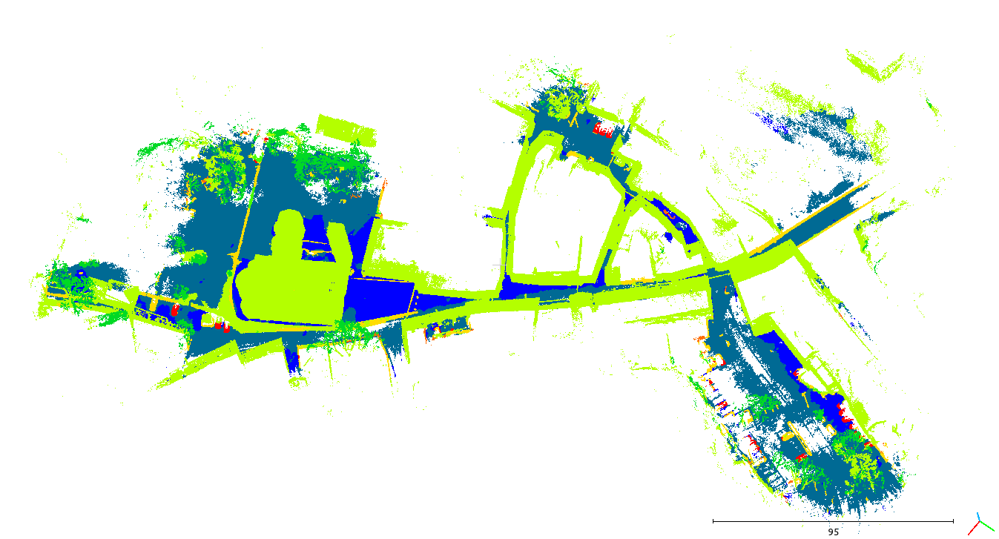

---
Agliate_2_xyznirgb_voxels.npy
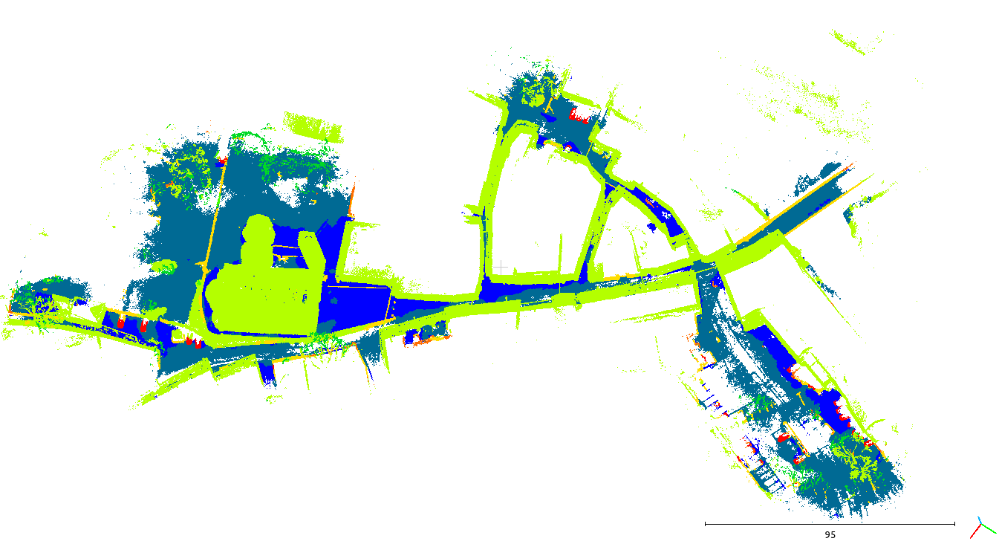

---


NO EFFECT

### fusion model

In [25]:
!python semantic3d_seg_fusion.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results02/Fusion_8192pts --model_rgb ./results02/SegBig_rgb --model_noc ./results02/SegBig_nocolor --test --savepts

Creating the network...Done
Agliate_2_xyzoirgb_aligned_voxels.npy
100%|█████████████████████████████████████| 1779/1779 [4:17:10<00:00,  8.67s/it]
(3456927, 3)
(3456927, 1)
2022-03-10 17:27:22.035477-Done.


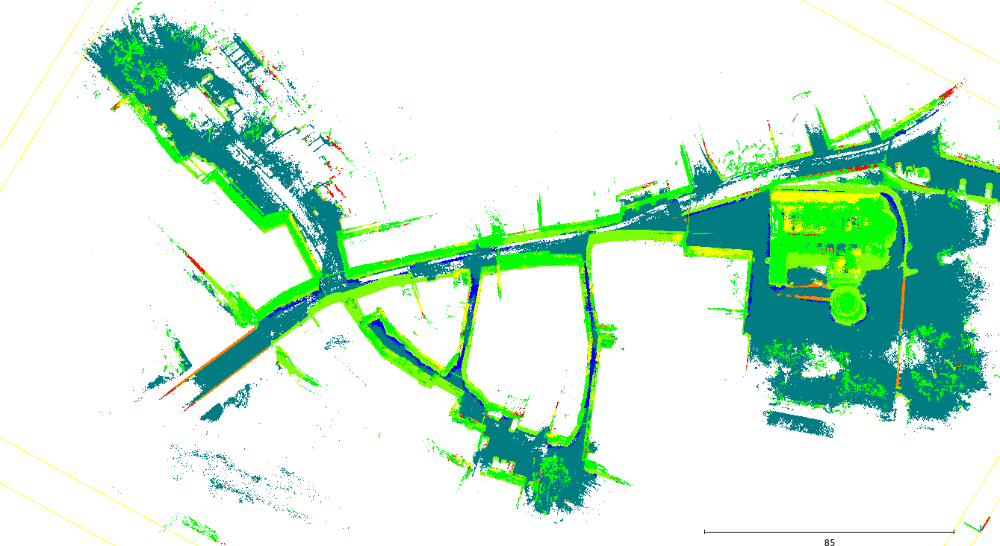

## Agliate outdoor data

In [56]:
cd ../semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


In [57]:
!python semantic3d_prepare_data.py --rootdir ./data

Creating test directories...done
Generating test files...
Agliate_outdoor_1_xyznirgbr
85.4M points loaded
Agliate_outdoor_2_xyznirgbr
71M points loadeded
Done


### semantic3d nocolor model

In [ ]:
!python semantic3d_seg.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_outdoor_1_xyznirgbr_voxels.npy
100%|█████████████████████████████████████| 2148/2148 [1:51:52<00:00,  3.13s/it]
(3676116, 3)
(3676116, 1)
Agliate_outdoor_2_xyznirgbr_voxels.npy
 51%|████████████████████▌                   | 931/1816 [47:05<45:39,  3.10s/it]

Agliate_outdoor_1_xyznirgbr_voxels<br>
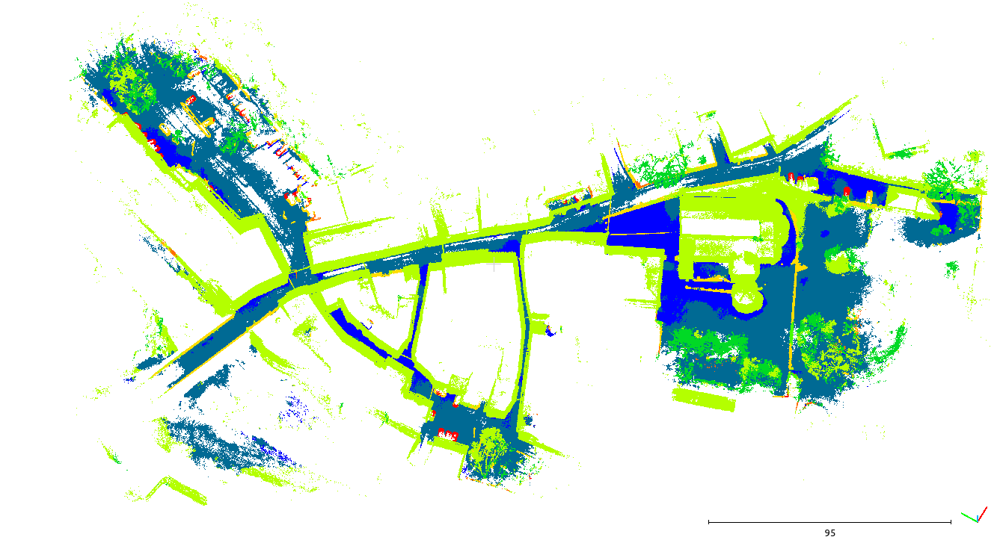

In [59]:
!python semantic3d_seg_k32.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Creating the network...Model with dropout
Done
Agliate_outdoor_1_xyznirgbr_voxels.npy
100%|█████████████████████████████████████| 2148/2148 [1:48:07<00:00,  3.02s/it]
(3676116, 3)
(3676116, 16)
Agliate_outdoor_2_xyznirgbr_voxels.npy
100%|█████████████████████████████████████| 1816/1816 [1:29:01<00:00,  2.94s/it]
(3018340, 3)
(3018340, 16)
2022-03-13 19:29:05.412160-Done.


Agliate_outdoor_1_xyznirgbr_voxels_k32.npy
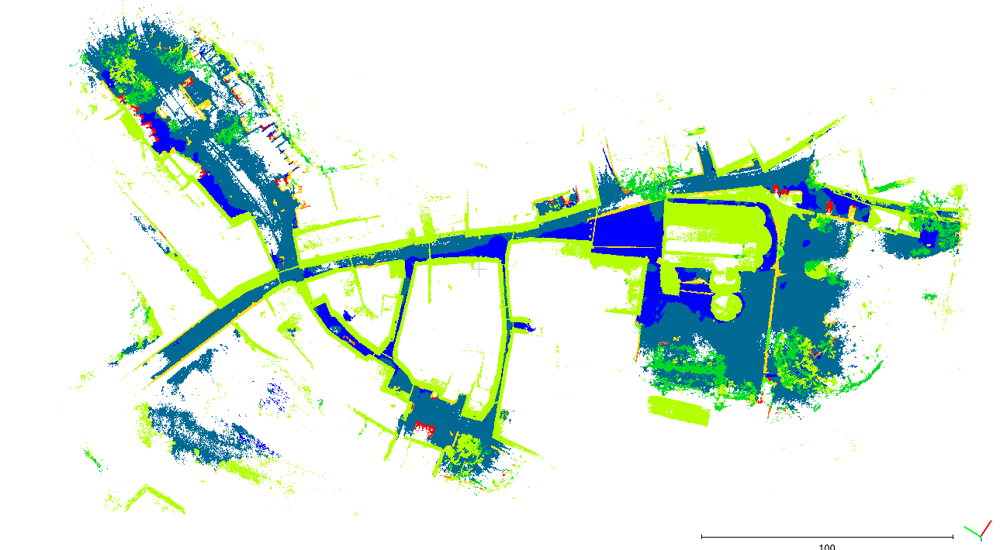

---
Agliate_outdoor_1_xyznirgbr_voxels_k32.npy
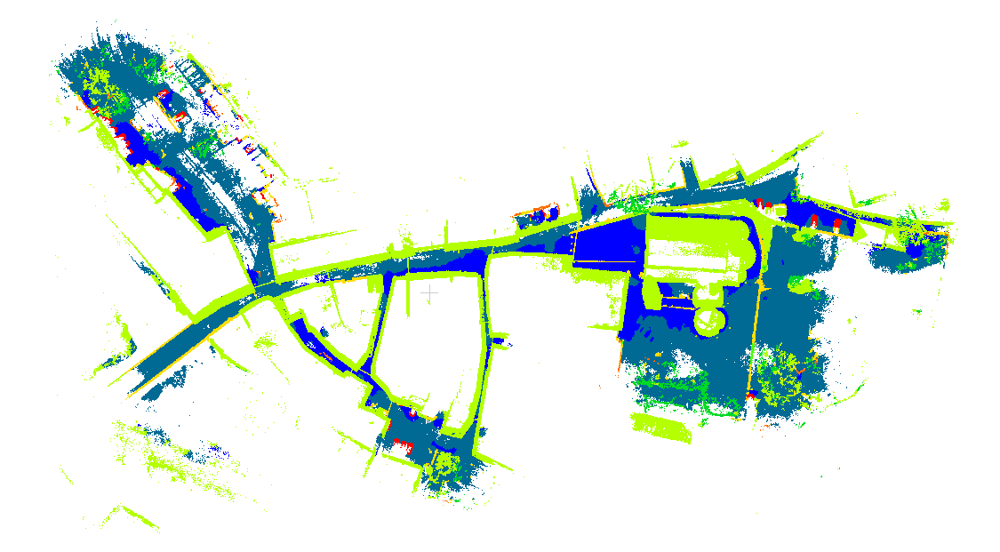

---

### NPM3D nocolor model

A_1_outdoor <br>
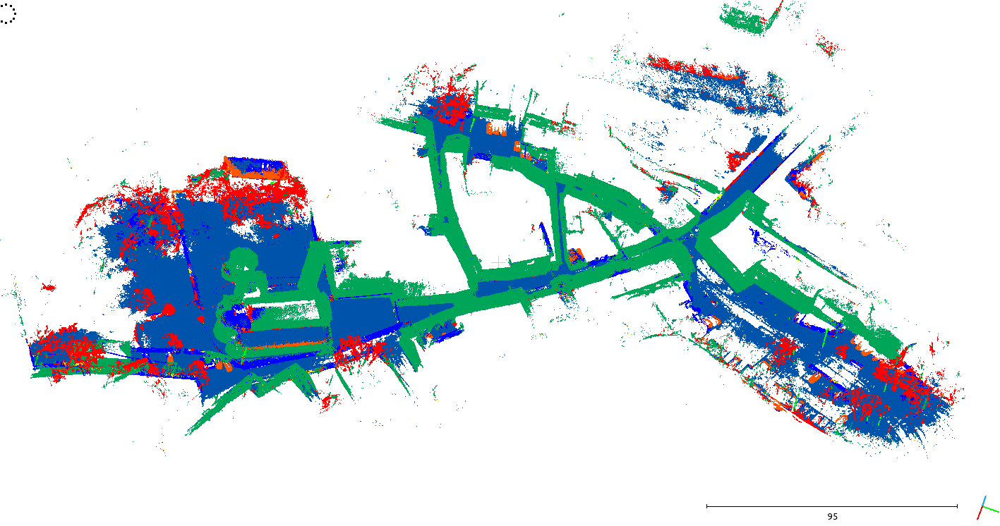

A_2_outdoor<br>
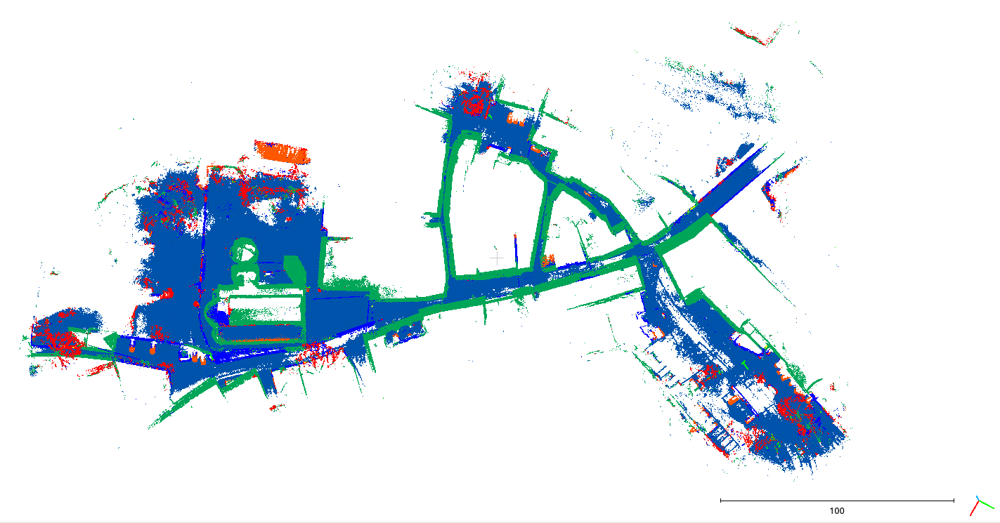

### NPM fusion model

A_1_outdoor<br>
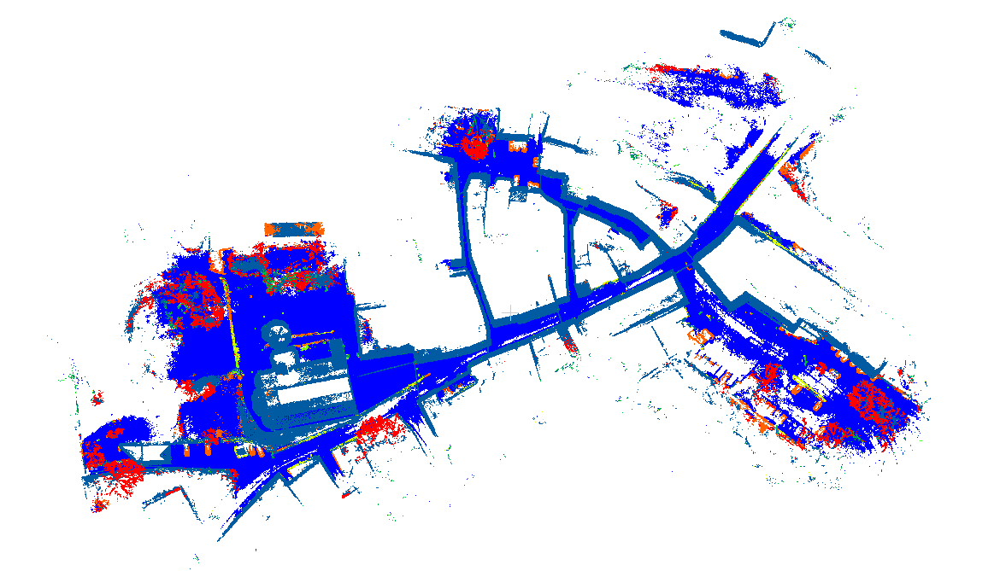

---

A_2_outdoor<br>
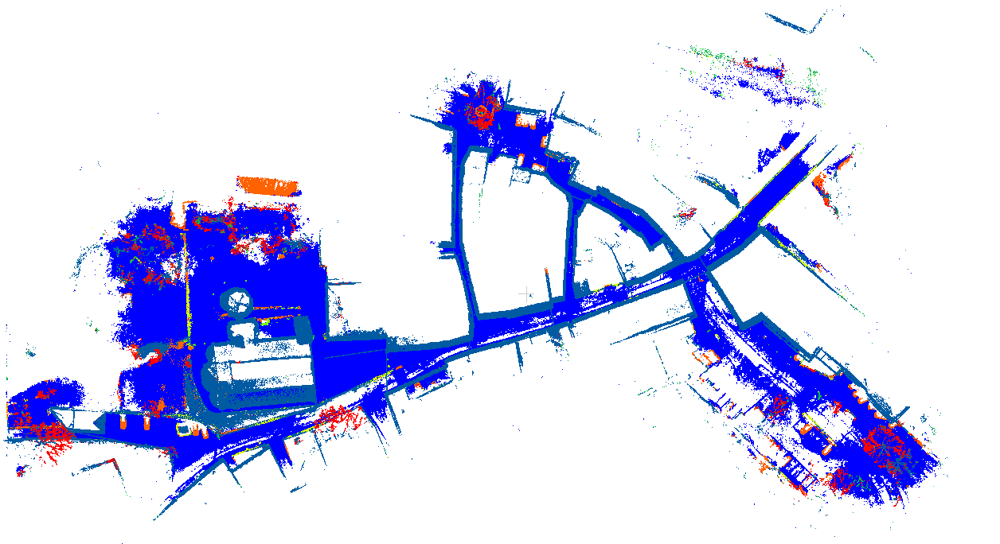

# Bassano data test

## pretrained model using semantic3d data

In [57]:
cd semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


### rgb model

Bassano_xyznirgb_voxels.npy_pts
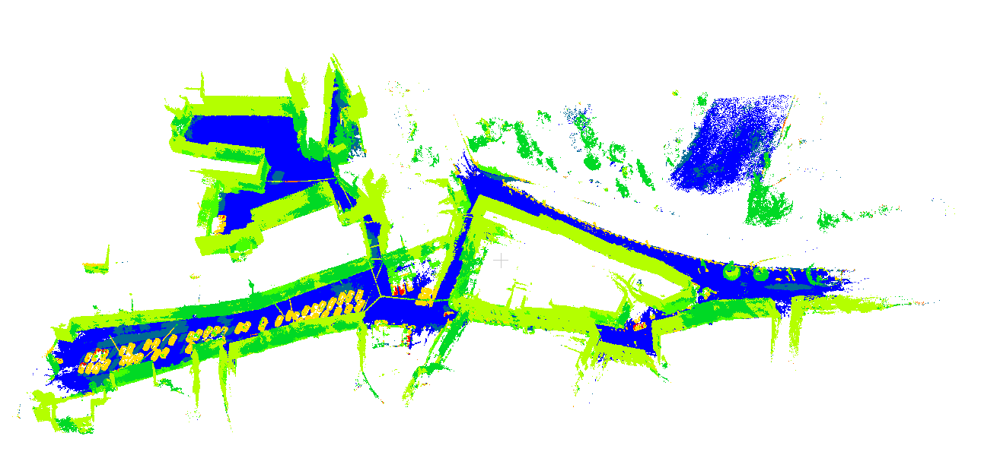

### nocolor model using different knn

Bassano_xyznirgb_voxels_k1.npy
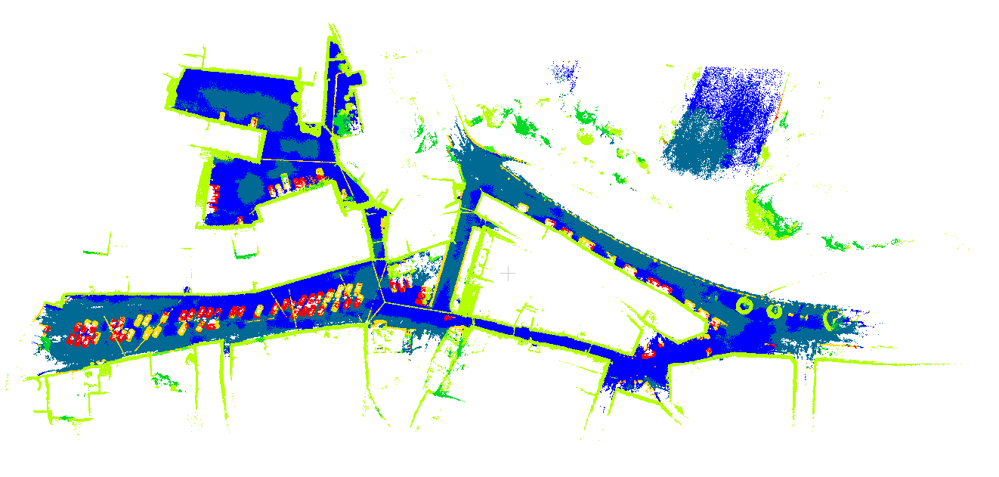

---
Bassano_xyznirgb_voxels_k16.npy
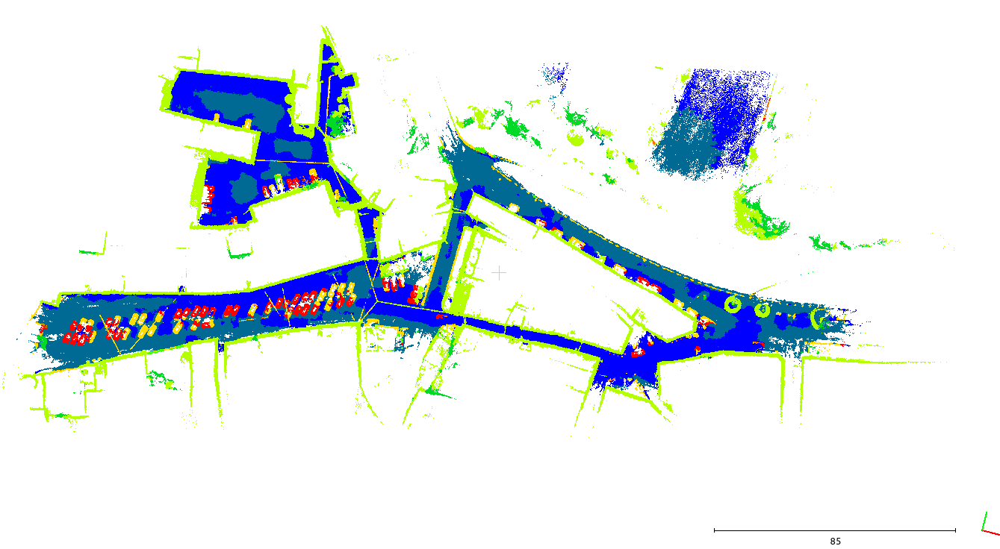

---
Bassano_xyznirgb_voxels_k32.npy
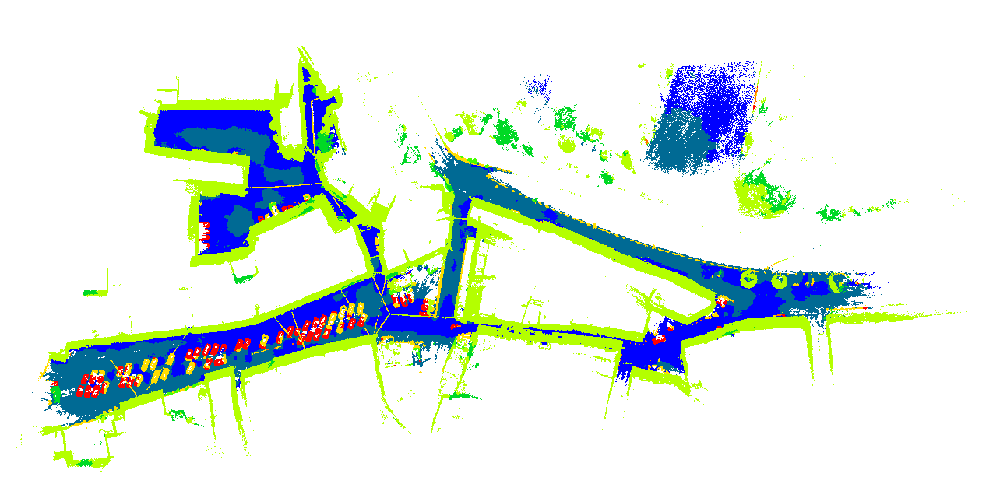

---

### fusion model

In [ ]:
!python semantic3d_seg_fusion.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results03/Fusion_8192pts --model_rgb ./results03/SegBig_rgb --model_noc ./results03/SegBig_nocolor --test --savepts

Creating the network...Done
Bassano_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 1325/1325 [4:04:56<00:00, 11.09s/it]
(3352984, 3)
(3352984, 1)
2022-04-13 14:04:10.661977-Done.


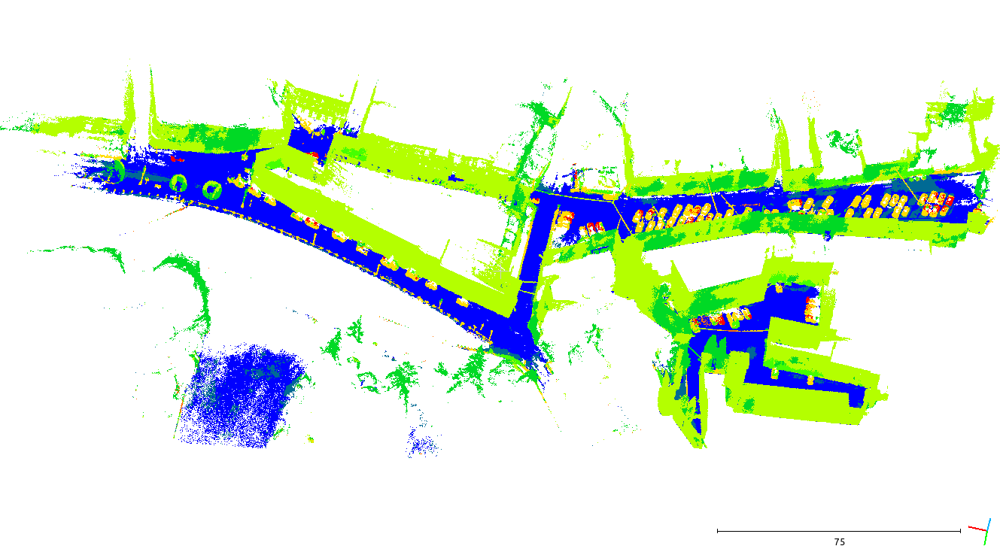

In [1]:
cd ./examples/semantic3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/semantic3d


In [3]:
!python semantic3d_seg_fusion.py --rootdir ./semantic3d_processed/test/pointcloud --savedir ./results04/Fusion_8192pts --model_rgb ./results03/SegBig_rgb --model_noc ./results04/SegBig_nocolor --test --savepts

Creating the network...Traceback (most recent call last):
  File "semantic3d_seg_fusion.py", line 440, in <module>
    main()
  File "semantic3d_seg_fusion.py", line 293, in main
    net_rgb.load_state_dict(torch.load(os.path.join(args.model_rgb, "state_dict.pth"), map_location=device))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/torch/nn/modules/module.py", line 1483, in load_state_dict
    self.__class__.__name__, "\n\t".join(error_msgs)))
RuntimeError: Error(s) in loading state_dict for SegBig:
	size mismatch for fcout.weight: copying a param with shape torch.Size([8, 128]) from checkpoint, the shape in current model is torch.Size([9, 128]).
	size mismatch for fcout.bias: copying a param with shape torch.Size([8]) from checkpoint, the shape in current model is torch.Size([9]).


## pretrained model using nmp3d

In [ ]:
cd ../npm3d

### intensity model

In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results03/SegBig_intensity --test --savepts

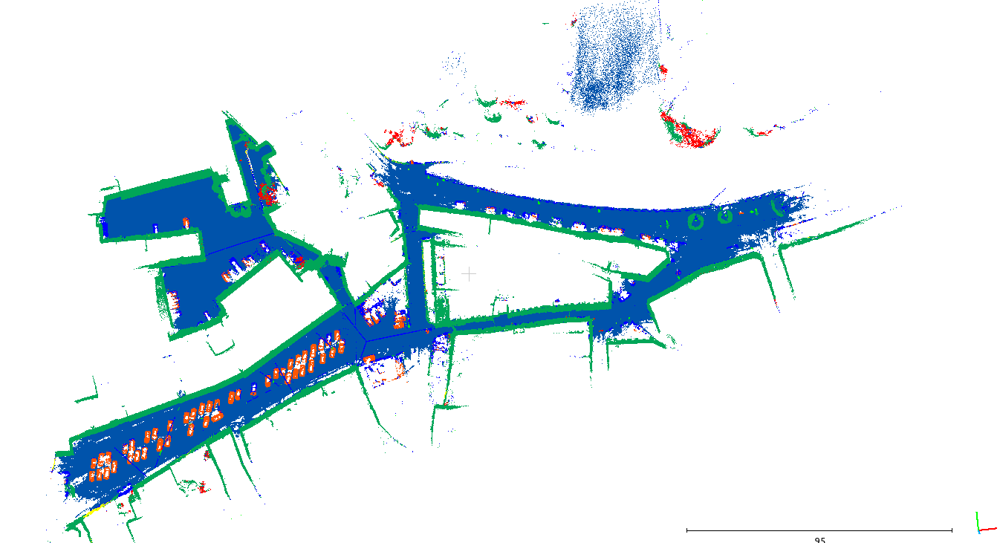
<br>
**car is much better than semantic3d model**

---

### nocolor model

In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

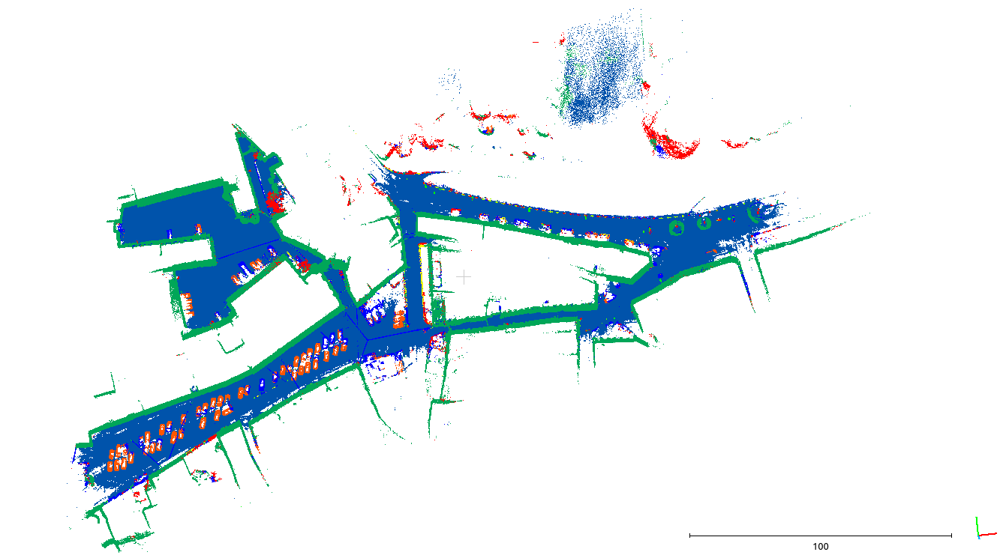

#### various try

##### Using downsampling data (copy from semantic3d/processed data)

In [2]:
cd examples/npm3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/npm3d


In [ ]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results03/SegBig_nocolor --test --savepts --nocolor

Create filelist...done, 0 train files, 2 test files <br>
Creating the network...Model with dropout<br>
Load pre-trained model done<br>
Testing on NPM3D<br>
Bassano_xyznirgb_voxels.npy<br>
100%|█████████████████████████████████████| 3089/3089 [2:35:53<00:00,  3.03s/it]<br>
scores shape: (3352984, 10)<br>
Computing neighbors...<br>
(3352984, 3)<br>
(3352984, 3)<br>
(3352984, 1)<br>
Done<br>

Bassano_xyznirgb_voxels05.npy
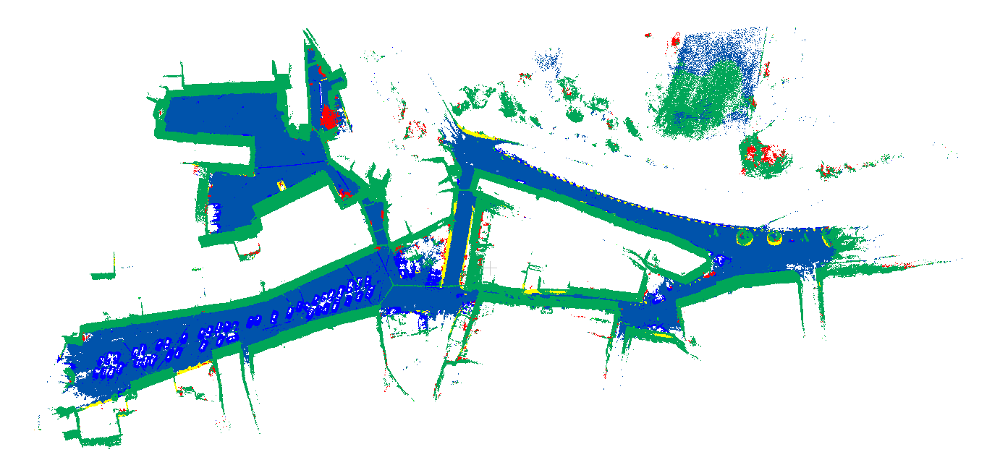


**only few parts were impacted, but much faster and memory occupied, may try to use this format as test data at initial stage**

##### change step_size

In [5]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./results03/SegBig_nocolor --test --savepts --nocolor --test_step 0.3

Create filelist...done, 0 train files, 2 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Bassano_xyznirgb_voxels.npy
100%|█████████████████████████████████████| 7755/7755 [6:34:04<00:00,  3.05s/it]
scores shape: (3352984, 10)
Computing neighbors...
(3352984, 3)
(3352984, 3)
(3352984, 1)
Done
make results file...
Saving results...
saveing file: ./results03/SegBig_nocolor/results/Bassano_xyznirgb_voxels.npy_pts.txt
output point cloud saved at ./results03/SegBig_nocolor
.ipynb_checkpoints
Traceback (most recent call last):
  File "npm3d_seg.py", line 397, in <module>
    main()
  File "npm3d_seg.py", line 349, in main
    nocolor=args.nocolor
  File "npm3d_seg.py", line 174, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errn

Bassano_xyznirgb_voxels.npy_pts03<br>
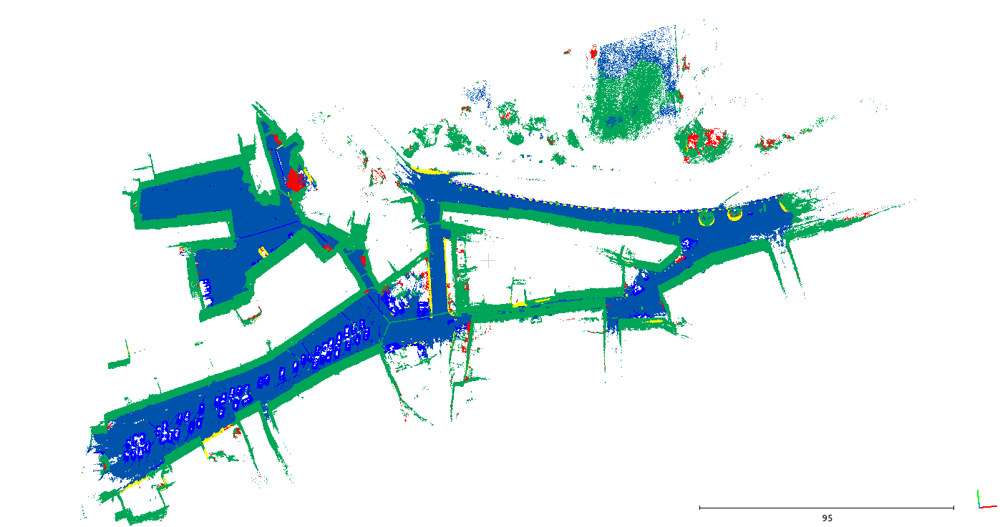

### fusion model

In [ ]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results03/Fusion_8192pts --model_rgb ./results03/SegBig_intensity --model_noc ./results03/SegBig_nocolor --test --savepts

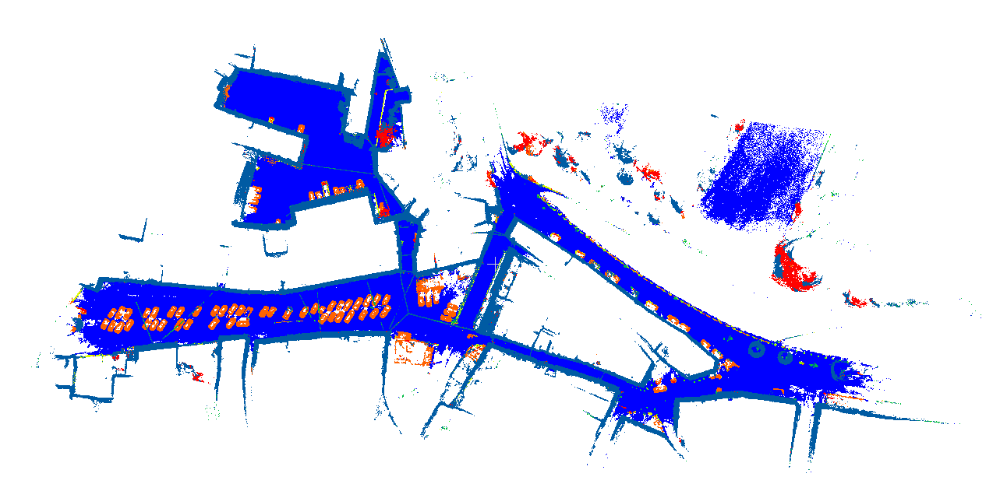

##### change block_size using fusion model

In [4]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results03/Fusion_8192pts --block_size 4 --model_rgb ./results03/SegBig_intensity --model_noc ./results03/SegBig_nocolor --test --savepts

Create filelist...done, 0 train files, 2 test files
Creating the network...Done
Bassano_xyzirgbr.npy
100%|█████████████████████████████████████| 1325/1325 [9:11:27<00:00, 24.97s/it]
(90267487, 3)
(90267487, 1)
1 9
.ipynb_checkpoints
Traceback (most recent call last):
  File "npm3d_seg_fusion.py", line 409, in <module>
    main()
  File "npm3d_seg_fusion.py", line 355, in main
    test_step=args.test_step
  File "npm3d_seg_fusion.py", line 172, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './npm_processed/test_pointclouds/.ipynb_checkpoints'


##### change step_size

In [ ]:
!python npm3d_seg_fusion.py --rootdir ./npm_processed --savedir ./results03/Fusion_8192pts --test_step 0.3 --model_rgb ./results03/SegBig_intensity --model_noc ./results03/SegBig_nocolor --test --savepts

---

change paris-ille data to different classes<br>
use part gt add to paris-ille data<br>
train again<br>

## Merge classes

1: 'man-made terrain'    -> 1
2: 'natural terrain',    -> 1
3: 'high vegetation',    -> 2
4: 'low vegetation',     -> 2
5: 'buildings',          -> 3
6: 'hard scape',         -> 1
7: 'scanning artefacts', -> 4
8: 'cars'                -> 5  

0: 'unclassified'    -> 0
1: 'ground',         -> 1
2: 'buildings',      -> 2
3: 'poles'           -> 3
4: 'bollards',       -> 3
5: 'trash cans',     -> 0
6: 'barriers',       -> 0
7: 'pedestrians',    -> 0
8: 'cars'            -> 4 
9: 'natural'         -> 5

In [75]:
def load_evaluation_points(file_path):
    data = read_ply(file_path)
    return np.vstack((data['x'], data['y'], data['z'], data[''])).T

In [ ]:
from helper_ply import read_ply, write_ply
import pandas as pd
import numpy as np
data = load_evaluation_points('./data/lecco/original_ply/Lecco_campus_1_right.ply')
preds = data[:,3]
print(points.shape)

In [65]:
for i in range(preds.shape[0]):
    if preds[i] == 2 or preds[i] == 6:
        preds[i] = 1
        continue
    elif preds[i] == 3 or preds[i] == 4:
        preds[i] = 2
        continue
    elif preds[i] == 5:
        preds[i] = 3
        continue
    elif preds [i] == 7 or preds[i] == 8:
        preds[i] -= 3
        continue
print(preds.shape)

(24231612, 1)


In [ ]:
points = load_evaluation_points('./data/lecco/original_ply/Lecco_campus_1_left.ply')
print(points.shape)
write_ply('./test/Log_2022-01-28_17-08-38/predictions/Lecco_campus_1_left_reclassed', [points, preds], ['x', 'y', 'z', 'predictions'])

(24231612, 3)


True

In [5]:
!python npm3d_prepare_data.py --rootdir ./data --destdir ./npm_processed

./data/refine/MiniLille1.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 01/04/2022 10:16
obj_info Generated by CloudCompare!
element vertex 1901853
property float x
property float y
property float z
property float scalar_class
end_header
(127,)
./data/refine/MiniLille2.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 01/04/2022 10:17
obj_info Generated by CloudCompare!
element vertex 2500428
property float x
property float y
property float z
property float scalar_class
end_header
(167,)
./data/refine/MiniParis1.ply
ply
format binary_little_endian 1.0
comment Created by CloudCompare v2.11.1 (Anoia)
comment Created 01/04/2022 10:19
obj_info Generated by CloudCompare!
element vertex 4159318
property float x
property float y
property float z
property float scalar_class
end_header
(278,)


In [18]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./finetune/SegBig_nocolor --nocolor --restore

Create filelist...done, 1132 train files, 2 test files
Creating the network...Model with dropout
loading weights...
Restore pre-trained model...
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:52:20<00:00,  6.74s/it, AA=0.72416, IOU=0.66387, LOSS=1.7500e-06, OA=0
Epoch 1: 100%|█| 1000/1000 [1:50:12<00:00,  6.61s/it, AA=0.83004, IOU=0.78763, LOSS=7.5616e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:50:52<00:00,  6.65s/it, AA=0.87289, IOU=0.82954, LOSS=6.4639e-07, OA=0
Epoch 3: 100%|█| 1000/1000 [1:50:46<00:00,  6.65s/it, AA=0.88823, IOU=0.84756, LOSS=5.5707e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:51:17<00:00,  6.68s/it, AA=0.90786, IOU=0.86844, LOSS=4.8866e-07, OA=0
Epoch 5: 100%|█| 1000/1000 [1:51:40<00:00,  6.70s/it, AA=0.91536, IOU=0.87777, LOSS=4.6798e-07, OA=0
Epoch 6: 100%|█| 1000/1000 [1:51:48<00:00,  6.71s/it, AA=0.91741, IOU=0.88184, LOSS=4.4430e-07, OA=0
Epoch 7: 100%|█| 1000/1000 [1:52:09<00:00,  6.73s/it, AA=0.92112, IOU=0.88663, LOSS=4.1292e-07, O

In [24]:
!python npm3d_seg.py --rootdir ./npm_processed --savedir ./finetune/SegBig_nocolor --test --savepts --nocolor --test_epoch '_0'

Create filelist...done, 1132 train files, 2 test files
Creating the network...Model with dropout
Load pre-trained model done
Testing on NPM3D
Bassano_xyzirgbr.npy
100%|█████████████████████████████████████| 3087/3087 [6:34:59<00:00,  7.68s/it]
scores shape: (90267487, 6)
Computing neighbors...
(90267487, 3)
(81319102, 3)
(90267487, 1)
Done
make results file...
Saving results...
saveing file: ./finetune/SegBig_nocolor/results/Bassano_xyzirgbr.npy_pts_0.txt
output point cloud saved at ./finetune/SegBig_nocolor
.ipynb_checkpoints
Traceback (most recent call last):
  File "npm3d_seg.py", line 410, in <module>
    if __name__ == '__main__':
  File "npm3d_seg.py", line 362, in main
    test_step=args.test_step,
  File "npm3d_seg.py", line 174, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADire

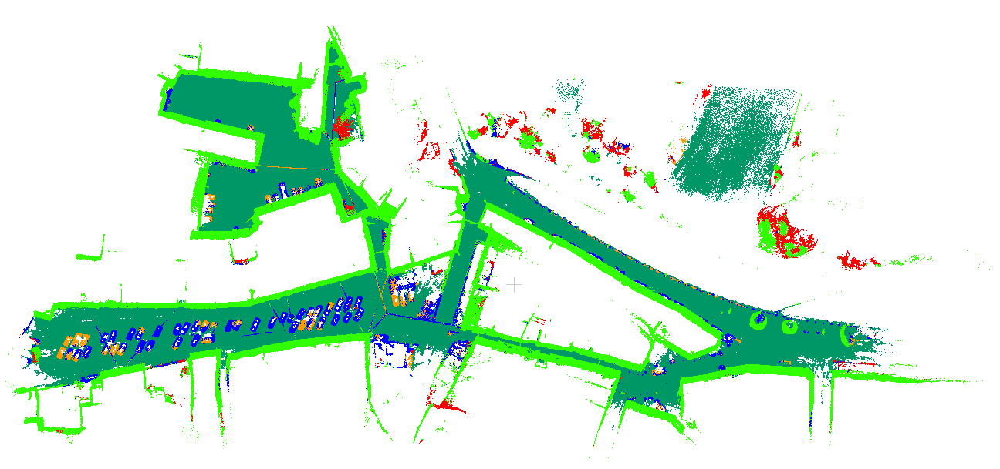

# pre-training using paris-lille dataset

In [27]:
cd ../paris3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/paris3d


In [31]:
!python prepare_data.py --rootdir ./Paris-Lille-3D --destdir ./paris_processed

./Paris-Lille-3D/training_10_classes/Lille1_1.ply
ply
format binary_little_endian 1.0
element vertex 30033430
property float x
property float y
property float z
property uchar reflectance
property int class
end_header
./Paris-Lille-3D/training_10_classes/Lille1_2.ply
ply
format binary_little_endian 1.0
element vertex 30014988
property float x
property float y
property float z
property uchar reflectance
property int class
end_header
./Paris-Lille-3D/training_10_classes/Lille2.ply
ply
format binary_little_endian 1.0
element vertex 21402421
property float x
property float y
property float z
property uchar reflectance
property int class
end_header
./Paris-Lille-3D/training_10_classes/Paris.ply
ply
format binary_little_endian 1.0
element vertex 38332543
property float x
property float y
property float z
property uchar reflectance
property int class
end_header


In [34]:
!python prepare_data.py --rootdir ./Paris-Lille-3D --destdir ./paris_processed --test

./Paris-Lille-3D/test_10_classes/ajaccio_2.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property float x_origin
property float y_origin
property float z_origin
property double GPS_time
property float reflectance
end_header
./Paris-Lille-3D/test_10_classes/ajaccio_57.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property float x_origin
property float y_origin
property float z_origin
property double GPS_time
property float reflectance
end_header
./Paris-Lille-3D/test_10_classes/dijon_9.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property float x_origin
property float y_origin
property float z_origin
property double GPS_time
property float reflectance
end_header


## pretrained model: semantic3d nocolor model -> finetunning with paris dataset and nocolor model

In [ ]:
!python seg.py --rootdir ./paris_processed --savedir ./finetune/SegBig_nocolor --nocolor --restore

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
loading weights...
Restore pre-trained model from pre-trained semantic 3d segbig_nocolor model
Done
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:05:08<00:00,  3.91s/it, AA=0.47424, IOU=0.41439, LOSS=6.0470e-07, OA=0
Epoch 1: 100%|█| 1000/1000 [1:04:56<00:00,  3.90s/it, AA=0.56593, IOU=0.50609, LOSS=2.5820e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:05:14<00:00,  3.91s/it, AA=0.61804, IOU=0.55301, LOSS=2.3035e-07, OA=0
Epoch 3: 100%|█| 1000/1000 [1:05:03<00:00,  3.90s/it, AA=0.67236, IOU=0.59917, LOSS=1.8787e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:05:29<00:00,  3.93s/it, AA=0.70022, IOU=0.62393, LOSS=1.7890e-07, OA=0
Epoch 5: 100%|█| 1000/1000 [1:05:44<00:00,  3.94s/it, AA=0.72071, IOU=0.64061, LOSS=1.7179e-07, OA=0
Epoch 6: 100%|█| 1000/1000 [1:05:34<00:00,  3.93s/it, AA=0.73572, IOU=0.65609, LOSS=1.5961e-07, OA=0
Epoch 7: 100%|█| 1000/1000 [1:05:39<00:00,  3.9

In [5]:
#epoch 0
!python seg.py --rootdir ./paris_processed --savedir ./finetune/SegBig_nocolor/SegBig_8192_nocolorTrue_drop5_2022-04-13-14-38-23 --test --savepts --nocolor --test_epoch '_0'

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Bassano_xyzirgbr.npy
100%|█████████████████████████████████████| 6174/6174 [6:35:13<00:00,  3.84s/it]
Computing neighbors
(90267487, 3)
(90267487, 1)
Done
.ipynb_checkpoints
Traceback (most recent call last):
  File "seg.py", line 407, in <module>
    main()
  File "seg.py", line 362, in main
    nocolor=args.nocolor
  File "seg.py", line 173, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './paris_processed/test_pointclouds/.ipynb_checkpoints'


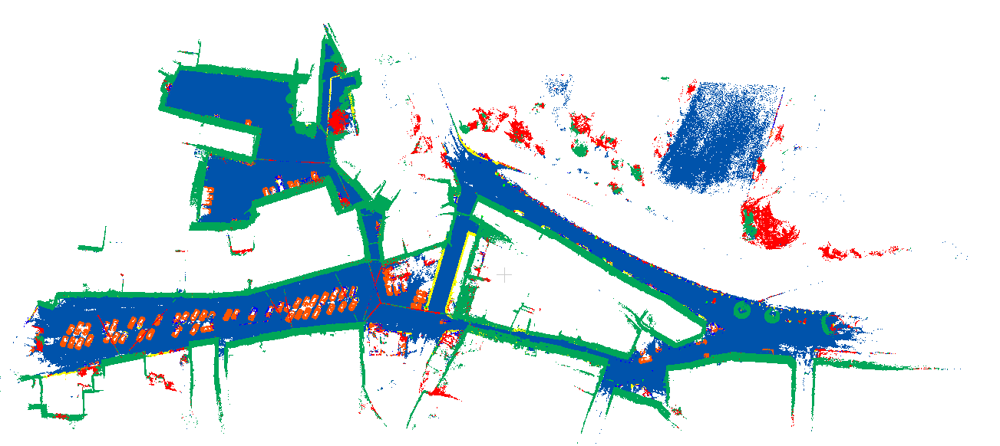

## pre-trained model: semantic3d rgb model

In [4]:
#epoch 0
!python seg.py --rootdir ./paris_processed --savedir ./finetune/SegBig_nocolor/SegBig_8192_nocolorTrue_drop0.5_2022-04-18-11-03-31 --test --savepts --nocolor --test_epoch '_0'

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Bassano_xyzirgbr.npy
100%|█████████████████████████████████████| 6174/6174 [6:51:54<00:00,  4.00s/it]
Computing neighbors
(90267487, 3)
(90267487, 1)
Done
.ipynb_checkpoints
Traceback (most recent call last):
  File "seg.py", line 408, in <module>
    main()
  File "seg.py", line 363, in main
    nocolor=args.nocolor
  File "seg.py", line 174, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './paris_processed/test_pointclouds/.ipynb_checkpoints'


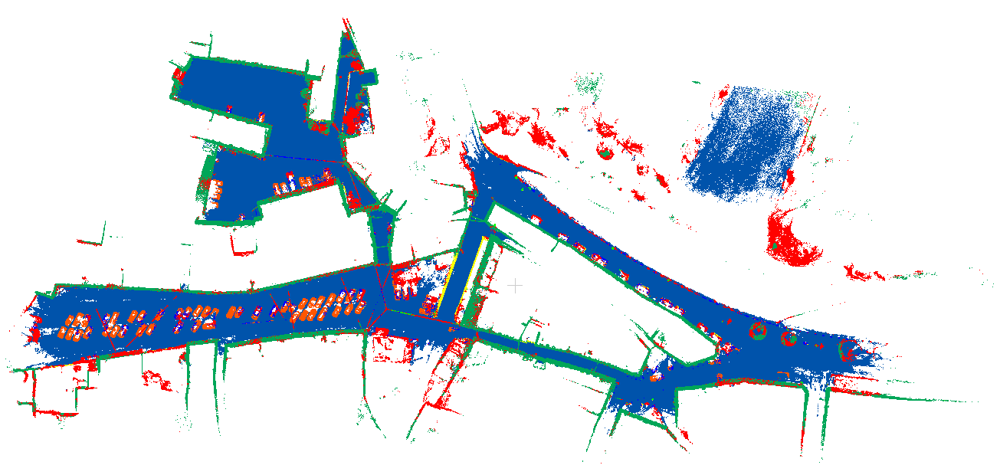

---

## test fusion model using finetuned model

In [4]:
cd paris3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/paris3d


In [5]:
!python seg_fusion.py --rootdir ./paris_processed --savedir ./finetune/Fusion_8192pts --model_rgb ./finetune/SegBig_intensity --model_noc ./finetune/SegBig_nocolor --test --savepts

Create filelist...done, 86 train files, 2 test files
Creating the network...Done
Bassano_xyzirgbr.npy
100%|█████████████████████████████████████| 1325/1325 [4:58:54<00:00, 13.54s/it]
(90267487, 3)
(90267487, 1)
1 9
.ipynb_checkpoints
Traceback (most recent call last):
  File "seg_fusion.py", line 409, in <module>
    main()
  File "seg_fusion.py", line 355, in main
    test_step=args.test_step
  File "seg_fusion.py", line 172, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './paris_processed/test_pointclouds/.ipynb_checkpoints'


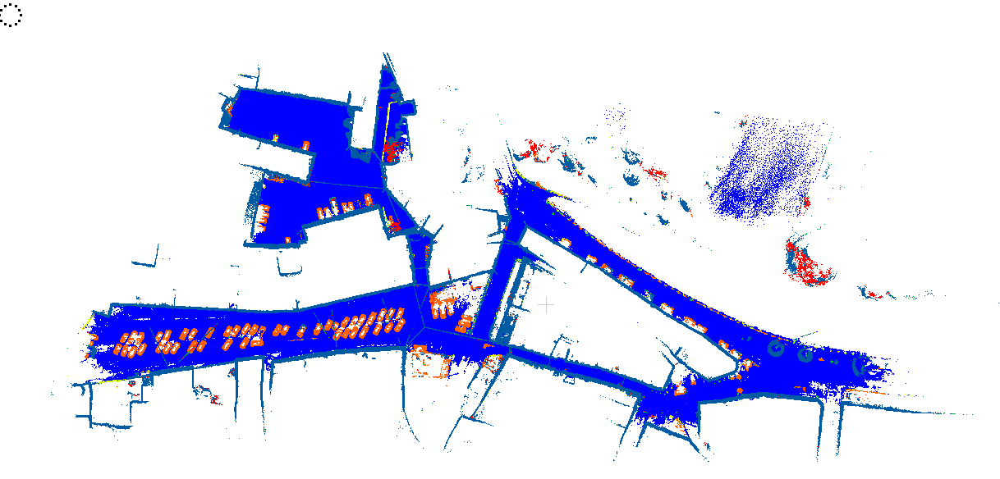

## finetune pre-trained semantic 3d segbig_nocolor model with paris data and focal loss

In [3]:
cd paris3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/paris3d


In [4]:
#train from scratch with focal_loss
!python seg.py --rootdir ./paris_processed --savedir ./results/SegBig_nocolor --nocolor --restore

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
loading weights...
Restore pre-trained model from pre-trained semantic 3d segbig_nocolor model
Done
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:04:15<00:00,  3.86s/it, AA=0.73602, IOU=0.64735, LOSS=1.8087e-07, OA=0
Epoch 1: 100%|█| 1000/1000 [1:04:48<00:00,  3.89s/it, AA=0.74440, IOU=0.65450, LOSS=1.8178e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:05:39<00:00,  3.94s/it, AA=0.76295, IOU=0.67597, LOSS=1.6525e-07, OA=0
Epoch 3: 100%|█| 1000/1000 [1:05:46<00:00,  3.95s/it, AA=0.76769, IOU=0.67828, LOSS=1.6150e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:05:45<00:00,  3.95s/it, AA=0.77445, IOU=0.68778, LOSS=1.5115e-07, OA=0
Epoch 5: 100%|█| 1000/1000 [1:05:23<00:00,  3.92s/it, AA=0.77770, IOU=0.69168, LOSS=1.4779e-07, OA=0
Epoch 6: 100%|█| 1000/1000 [1:05:21<00:00,  3.92s/it, AA=0.78595, IOU=0.69949, LOSS=1.4438e-07, OA=0
Epoch 7: 100%|█| 1000/1000 [1:05:14<00:00,  3.9

In [4]:
!python seg.py --rootdir ./paris_processed --savedir ./results/SegBig_nocolor --test --savepts --nocolor --test_epoch ''

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Bassano_xyznxnynz.npy
100%|█████████████████████████████████████| 6174/6174 [8:38:11<00:00,  5.04s/it]
Computing neighbors
(90267487, 3)
(90267487, 1)
Done
.ipynb_checkpoints
Traceback (most recent call last):
  File "seg.py", line 408, in <module>
    main()
  File "seg.py", line 363, in main
    nocolor=args.nocolor
  File "seg.py", line 174, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './paris_processed/test_pointclouds/.ipynb_checkpoints'


In [3]:
cd paris3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/paris3d


# use normals as input/npm3d sample

In [3]:
cd paris3d

/home/marco/Documents/lecco_dataset/ConvPoint-master/examples/paris3d


In [29]:
import open3d as o3d
from ply import write_ply
import numpy as np
from plyfile import PlyData

#ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('./Paris-Lille-3D/test_10_classes/Bassano_xyzoirgbr.ply')
print(pcd)

pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=10))

normals=np.asarray(pcd.normals)[:, :]

#save point cloud
plydata = PlyData.read('./Paris-Lille-3D/test_10_classes/Bassano_xyzoirgbr.ply')
print(plydata)
x = plydata["vertex"].data["x"].astype(np.float32)
y = plydata["vertex"].data["y"].astype(np.float32)
z = plydata["vertex"].data["z"].astype(np.float32)
#label = np.expand_dims(plydata["vertex"].data["class"].astype(np.int8),1)

points = np.concatenate([
                np.expand_dims(x,1),
                np.expand_dims(y,1),
                np.expand_dims(z,1),
                ], axis=1).astype(np.float32)

write_ply('./Paris-Lille-3D/test_10_classes/Bassano_xyznxnynz.ply', [points, normals], ['x','y','z','nx','ny','nz'])

PointCloud with 90267487 points.
ply
format binary_little_endian 1.0
element vertex 90267487
property float x
property float y
property float z
property float intensity
property char red
property char green
property char blue
end_header


True

In [21]:
!python prepare_data_normals.py --rootdir ./Paris-Lille-3D --destdir ./paris_processed

./Paris-Lille-3D/training_10_classes/Lille1_1_normals.ply
ply
format binary_little_endian 1.0
element vertex 30033430
property float x
property float y
property float z
property double nx
property double ny
property double nz
property char class
end_header
./Paris-Lille-3D/training_10_classes/Lille1_2_normals.ply
ply
format binary_little_endian 1.0
element vertex 30014988
property float x
property float y
property float z
property double nx
property double ny
property double nz
property char class
end_header
./Paris-Lille-3D/training_10_classes/Lille2_normals.ply
ply
format binary_little_endian 1.0
element vertex 21402421
property float x
property float y
property float z
property double nx
property double ny
property double nz
property char class
end_header
./Paris-Lille-3D/training_10_classes/Paris_normals.ply
ply
format binary_little_endian 1.0
element vertex 38332543
property float x
property float y
property float z
property double nx
property double ny
property double nz
property

In [23]:
!python prepare_data_normals.py --rootdir ./Paris-Lille-3D --destdir ./paris_processed --test

./Paris-Lille-3D/test_10_classes/ajaccio_2_normals.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property double nx
property double ny
property double nz
end_header
./Paris-Lille-3D/test_10_classes/ajaccio_57_normals.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property double nx
property double ny
property double nz
end_header
./Paris-Lille-3D/test_10_classes/dijon_9_normals.ply
ply
format binary_little_endian 1.0
element vertex 10000000
property float x
property float y
property float z
property double nx
property double ny
property double nz
end_header


In [30]:
!python prepare_data_normals.py --rootdir ./Paris-Lille-3D --destdir ./paris_processed --test

./Paris-Lille-3D/test_10_classes/Bassano_xyznxnynz.ply
ply
format binary_little_endian 1.0
element vertex 90267487
property float x
property float y
property float z
property double nx
property double ny
property double nz
end_header


In [26]:
#train from scratch with focal_loss
!python seg_normals.py --rootdir ./paris_processed --savedir ./results/SegBig_normals

Create filelist...done, 86 train files, 3 test files
Creating the network...Model with dropout
Done
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:06:08<00:00,  3.97s/it, AA=0.41416, IOU=0.34522, LOSS=7.7552e-07, OA=0
Epoch 1: 100%|█| 1000/1000 [1:06:27<00:00,  3.99s/it, AA=0.52339, IOU=0.45392, LOSS=4.0032e-07, OA=0
Epoch 2: 100%|█| 1000/1000 [1:06:36<00:00,  4.00s/it, AA=0.57469, IOU=0.50394, LOSS=3.2390e-07, OA=0
Epoch 3: 100%|█| 1000/1000 [1:06:54<00:00,  4.01s/it, AA=0.61362, IOU=0.53902, LOSS=2.7233e-07, OA=0
Epoch 4: 100%|█| 1000/1000 [1:06:27<00:00,  3.99s/it, AA=0.64350, IOU=0.56741, LOSS=2.4518e-07, OA=0
Epoch 5: 100%|█| 1000/1000 [1:06:32<00:00,  3.99s/it, AA=0.66958, IOU=0.58818, LOSS=2.2940e-07, OA=0
Epoch 6: 100%|█| 1000/1000 [1:06:37<00:00,  4.00s/it, AA=0.68332, IOU=0.60185, LOSS=2.2339e-07, OA=0
Epoch 7: 100%|█| 1000/1000 [1:06:41<00:00,  4.00s/it, AA=0.70876, IOU=0.62687, LOSS=1.9650e-07, OA=0
Epoch 8: 100%|█| 1000/1000 [1:06:36<00:00

In [ ]:
#test
!python seg_normals.py --rootdir ./paris_processed --savedir ./results/SegBig_normals/SegBig_8192_nocolorFalse_drop0.5_2022-05-14-21-02-42 --test --savepts --test_epoch ''

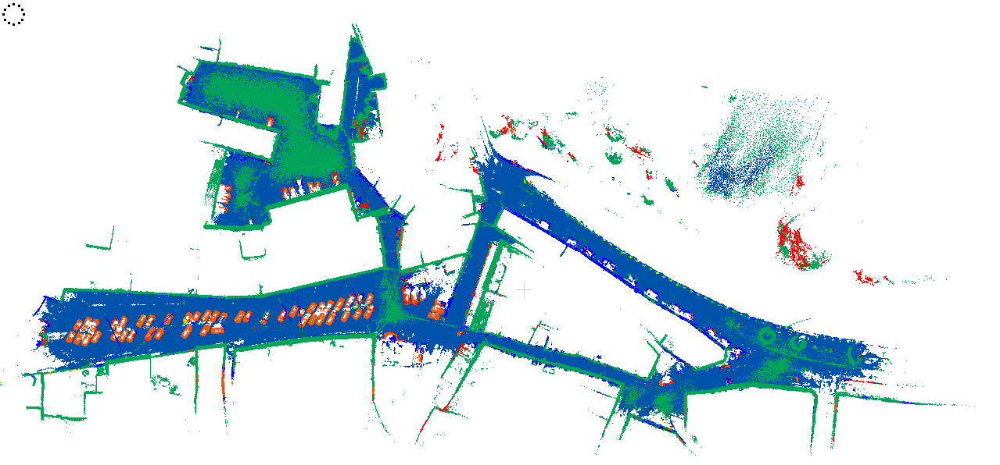

In [33]:
#train from scratch with normal loss
!python seg_normals.py --rootdir ./paris_processed --savedir ./results/SegBig_normals

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
Done
Create the datasets...Done
Create optimizer...Done
Epoch 0: 100%|█| 1000/1000 [1:06:21<00:00,  3.98s/it, AA=0.38771, IOU=0.32967, LOSS=5.2755e-06, OA=0
Epoch 1: 100%|█| 1000/1000 [1:06:31<00:00,  3.99s/it, AA=0.49700, IOU=0.43382, LOSS=2.9605e-06, OA=0
Epoch 2: 100%|█| 1000/1000 [1:07:30<00:00,  4.05s/it, AA=0.52711, IOU=0.46504, LOSS=2.5273e-06, OA=0
Epoch 3: 100%|█| 1000/1000 [1:08:16<00:00,  4.10s/it, AA=0.56024, IOU=0.50035, LOSS=2.2195e-06, OA=0
Epoch 4: 100%|█| 1000/1000 [1:09:21<00:00,  4.16s/it, AA=0.59256, IOU=0.53257, LOSS=1.9249e-06, OA=0
Epoch 5: 100%|█| 1000/1000 [1:08:01<00:00,  4.08s/it, AA=0.63460, IOU=0.56700, LOSS=1.8009e-06, OA=0
Epoch 6: 100%|█| 1000/1000 [1:07:52<00:00,  4.07s/it, AA=0.64856, IOU=0.57830, LOSS=1.8527e-06, OA=0
Epoch 7: 100%|█| 1000/1000 [1:08:20<00:00,  4.10s/it, AA=0.67168, IOU=0.59965, LOSS=1.6312e-06, OA=0
Epoch 8: 100%|█| 1000/1000 [1:09:18<00:00

In [34]:
!python seg_normals.py --rootdir ./paris_processed --savedir ./results/SegBig_normals/SegBig_8192_nocolorFalse_drop0.5_2022-05-23-09-54-18 --test --savepts --test_epoch ''

Create filelist...done, 86 train files, 2 test files
Creating the network...Model with dropout
Done
Testing on NPM3D
Bassano_xyznxnynz.npy
100%|█████████████████████████████████████| 6174/6174 [8:52:30<00:00,  5.17s/it]
Computing neighbors
(90267487, 3)
(90267487, 1)
Done
.ipynb_checkpoints
Traceback (most recent call last):
  File "seg_normals.py", line 408, in <module>
    main()
  File "seg_normals.py", line 363, in main
    nocolor=args.nocolor
  File "seg_normals.py", line 174, in __init__
    self.xyzrgb = np.load(os.path.join(self.folder, self.filename))
  File "/home/marco/miniconda3/envs/tf/lib/python3.6/site-packages/numpy/lib/npyio.py", line 416, in load
    fid = stack.enter_context(open(os_fspath(file), "rb"))
IsADirectoryError: [Errno 21] Is a directory: './paris_processed/test_pointclouds/.ipynb_checkpoints'


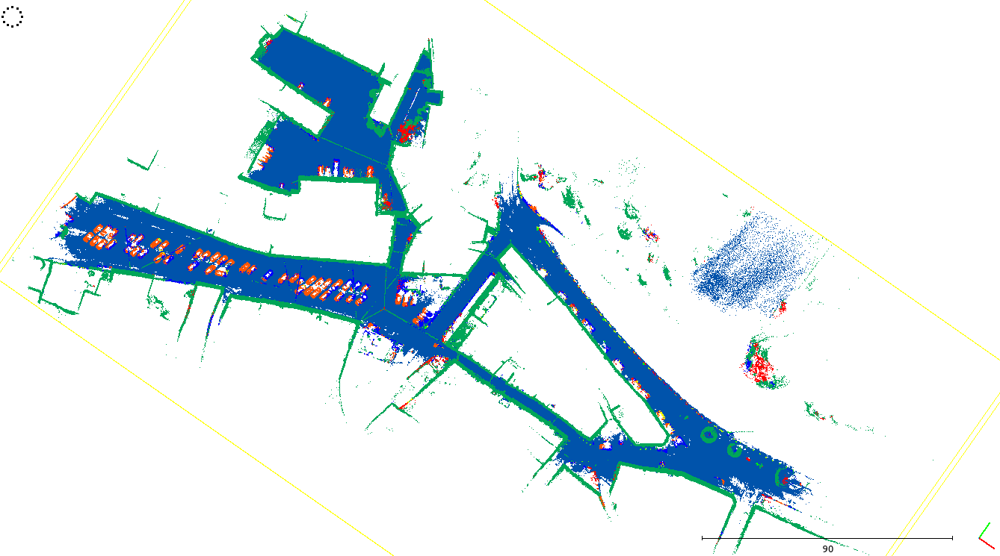